# Home Credit Default Risk :
*Can you predict how capable each applicant is of repaying a loan ?*

## EDA

In [1]:
import sys
!{sys.executable} --version

Python 3.9.7


In [2]:
!{sys.executable} -m pip --version

pip 22.3.1 from C:\Users\patri\anaconda3\lib\site-packages\pip (python 3.9)



In [3]:
!{sys.executable} -m pip install --upgrade pip setuptools wheel

In [4]:
!{sys.executable} -m pip install lightgbm

In [5]:
!{sys.executable} -m pip install imblearn

Importation des modules nécessaires

In [6]:
#import sys
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler, RobustScaler, QuantileTransformer, MinMaxScaler, MaxAbsScaler, Normalizer, PowerTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, average_precision_score, roc_auc_score
from functions_utils_PCA import *
from functions_utils import *
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import re
from collections import Counter
from lightgbm_with_simple_features import *
from imblearn.over_sampling import SMOTE
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
#import lightgbm as lgb
from lightgbm import LGBMClassifier
import pickle

- **Gestion des** *warnings*

In [7]:
warnings.filterwarnings("ignore")

Configuration des dimensions d'affichage des DataFrames

In [8]:
pd.set_option("display.max_rows", 1000)
pd.set_option("display.max_columns", 100)

Configuration du thème pour les graphiques

In [9]:
sns.set_theme(style="whitegrid")

Création du DataFrame **df_application_train**

In [10]:
df_application_train = pd.read_csv("C:\\Users\\patri\\OneDrive\Documents\\OpenClassroom\Projets\\Projet #7\\Home_Credit_Default_Risk\\application_train.csv")

In [11]:
df_application_train.head(100)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,...,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.000,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,...,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.000,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,...,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.000,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.000,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.000,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary sp

In [12]:
df_application_train.shape

(307511, 122)

In [13]:
df_application_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [14]:
df_application_train.nunique()

SK_ID_CURR                      307511
TARGET                               2
NAME_CONTRACT_TYPE                   2
CODE_GENDER                          3
FLAG_OWN_CAR                         2
FLAG_OWN_REALTY                      2
CNT_CHILDREN                        15
AMT_INCOME_TOTAL                  2548
AMT_CREDIT                        5603
AMT_ANNUITY                      13672
AMT_GOODS_PRICE                   1002
NAME_TYPE_SUITE                      7
NAME_INCOME_TYPE                     8
NAME_EDUCATION_TYPE                  5
NAME_FAMILY_STATUS                   6
NAME_HOUSING_TYPE                    6
REGION_POPULATION_RELATIVE          81
DAYS_BIRTH                       17460
DAYS_EMPLOYED                    12574
DAYS_REGISTRATION                15688
DAYS_ID_PUBLISH                   6168
OWN_CAR_AGE                         62
FLAG_MOBIL                           2
FLAG_EMP_PHONE                       2
FLAG_WORK_PHONE                      2
FLAG_CONT_MOBILE         

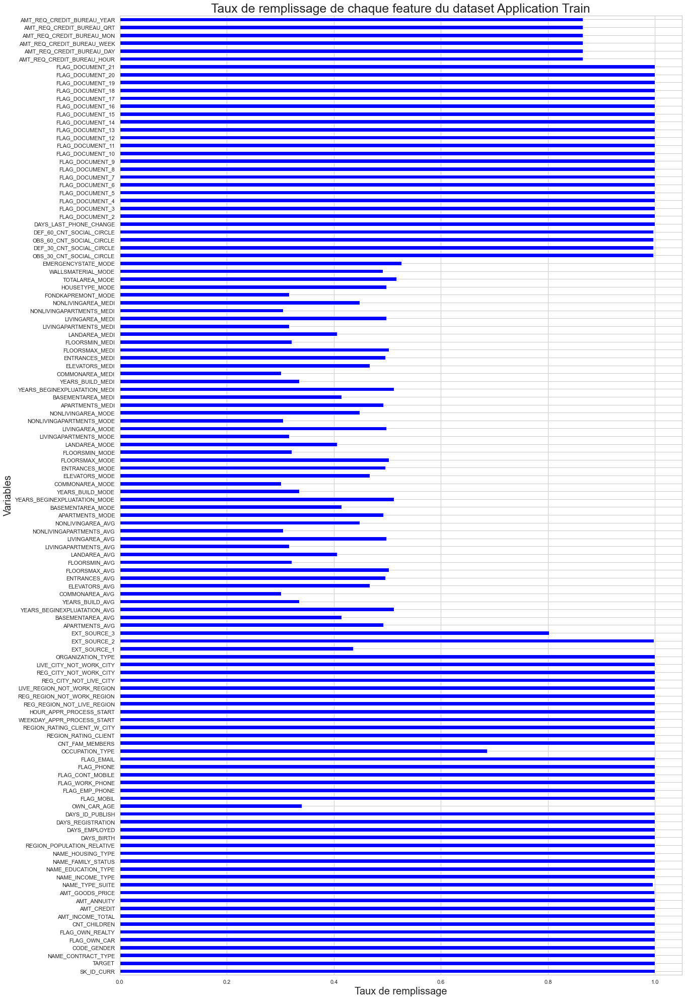

In [15]:
df_application_train.name = "Application Train"
afficher_taux_remplissage_variables(df_application_train, largeur=20, longueur=35, titre="Taux de remplissage de chaque feature")

In [16]:
# Statistiques descriptives de l'ensembles de variables numériques
df_application_train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,...,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,...,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,...,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192

In [17]:
# Liste des features catégorielles
features_cat = [col for col in df_application_train.columns if df_application_train[col].dtypes == 'O']
print(f"Le DataFrame df_application_train a {df_application_train.shape[1]} features dont {len(features_cat)}")

Le DataFrame df_application_train a 122 features dont 16


In [18]:
# Liste des features numériques
features_num = [col for col in df_application_train.columns if df_application_train[col].dtypes != 'O']
print(f"Le DataFrame df_application_train a {df_application_train.shape[1]} features dont {len(features_num)}")

Le DataFrame df_application_train a 122 features dont 106


In [19]:
# Suppression de toutes les variables catégorielle
df_application_train.drop(columns=features_cat, inplace=True)
print(f"Les dimension du DataFrame df_application_train après suppression des variables catégorielle est : {df_application_train.shape}")

Les dimension du DataFrame df_application_train après suppression des variables catégorielle est : (307511, 106)


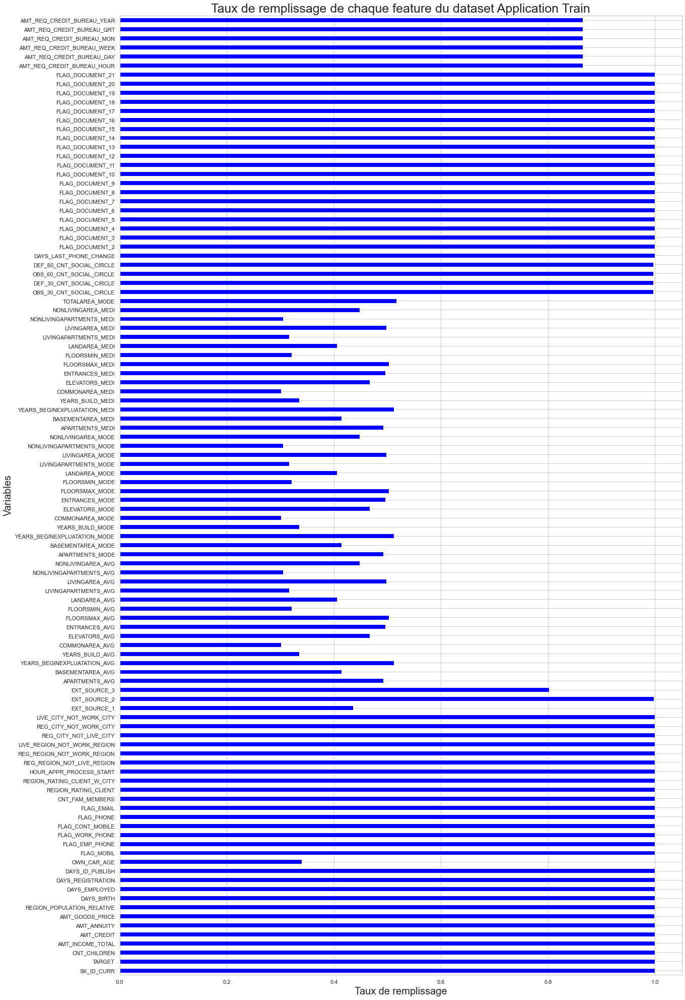

In [20]:
afficher_taux_remplissage_variables(df_application_train, largeur=20, longueur=35, titre="Taux de remplissage de chaque feature")

In [21]:
# Nombre de valeurs manquantes par variables
df_application_train.isna().sum()

SK_ID_CURR                           0
TARGET                               0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE                     0
FLAG_PHONE                           0
FLAG_EMAIL                           0
CNT_FAM_MEMBERS                      2
REGION_RATING_CLIENT                 0
REGION_RATING_CLIENT_W_CITY          0
HOUR_APPR_PROCESS_START              0
REG_REGION_NOT_LIVE_REGION           0
REG_REGION_NOT_WORK_REGION           0
LIVE_REGION_NOT_WORK_REGI

In [22]:
# Suppression des variables avec un taux de remplissage < 50%
df_application_train = supprimer_variables_TR(df_application_train, 0.5)
print(f"Les dimension du DataFrame df_application_train après suppression des variables ayant un taux de remplissage < 50% : {df_application_train.shape}")

Les dimension du DataFrame df_application_train après suppression des variables ayant un taux de remplissage < 50% : (307511, 68)


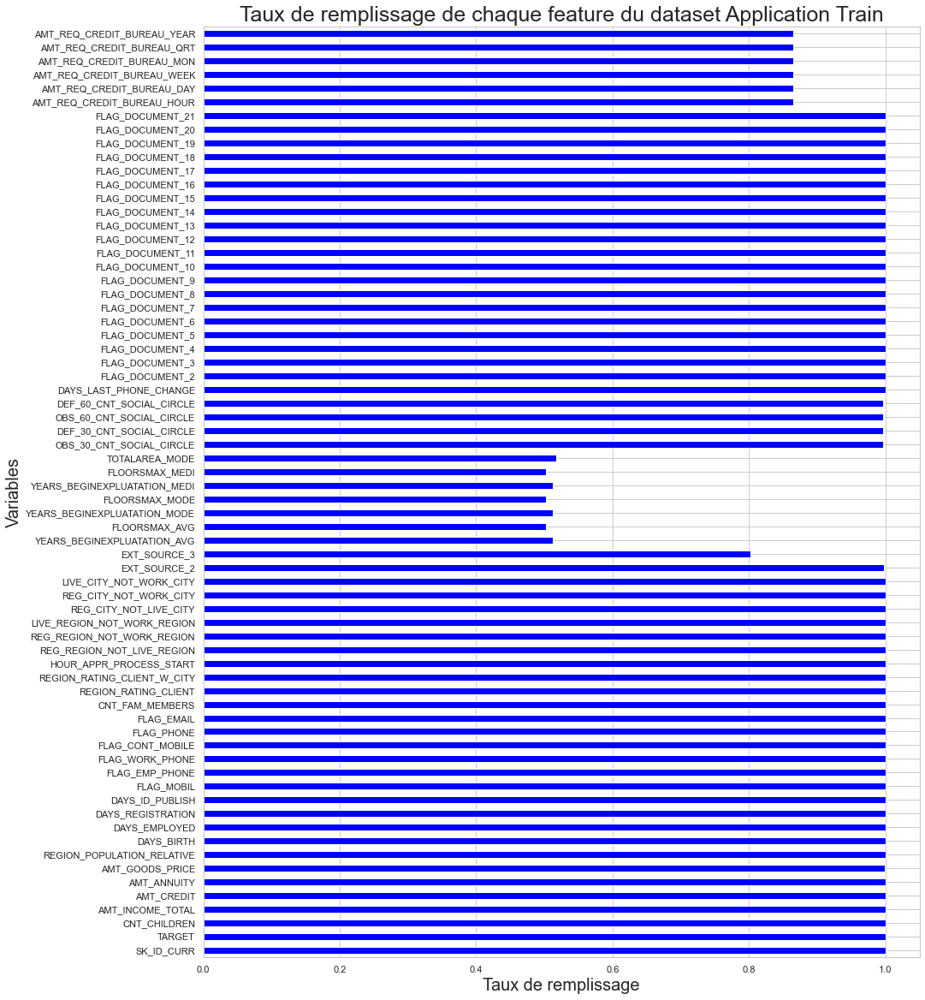

In [23]:
df_application_train.name = "Application Train"
afficher_taux_remplissage_variables(df_application_train, largeur=15, longueur=20, titre="Taux de remplissage de chaque feature")

In [24]:
# Recherche des doublons
df_application_train.duplicated().sum()

0

In [25]:
# Statistiques descriptives de l'ensembles de variables numériques
df_application_train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,3.068510e+05,246546.000000,157504.000000,154491.000000,157504.000000,154491.000000,157504.000000,154491.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,5.143927e-01,0.510853,0.977735,0.226282,0.977065,0.222315,0.977752,0.225897,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192,0.081376,0.003896,0.000023,0.003912,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,0.001803,0.384280,0.399526,0.043164,0.449521,0.231307,0.910682,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,1.910602e-01,0.194844,0.059223,0.144641,0.064575,0.143709,0.059897,0.145067,0.107462,2.400989,0.446698,2.379803,0.362291,826.808487,0.006502,0.453752,0.009016,0.122010,0.283376,0.013850,0.273412,0.062295,0.004771,0.062424,0.002550,0.059268,0.054110,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0

### Imputation des données manquantes :
*Utilisation de **SimpleImputer** de la librairie datawig*

In [26]:
# La liste de toutes les features numériques de df_application_train saut 'TARGET'
all_features_numeric = df_application_train.columns
all_features_numeric = list(all_features_numeric)
print(f"Taille de la liste des features : {len(all_features_numeric)}")
all_features_numeric.remove('TARGET')
print(f"Taille de la liste des features après retrait de TARGET: {len(all_features_numeric)}")
all_features_numeric

Taille de la liste des features : 68
Taille de la liste des features après retrait de TARGET: 67


['SK_ID_CURR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMEN

In [27]:
# Installation de la librairie datawig
# !{sys.executable} -m pip install datawig

In [28]:
#import datawig

# Implémentation de l'imputation des données manquante avec SimpleImputer
#df_train, df_test = datawig.utils.random_split(df_application_train)

#Initialize a SimpleImputer model
#imputer = datawig.SimpleImputer(
#    input_columns=all_features_numeric, # column(s) containing information about the column we want to impute
#    output_column='TARGET', # the column we'd like to impute values for
#    output_path = 'imputer_model' # stores model data and metrics
#    )

#Fit an imputer model on the train data
#imputer.fit(train_df=df_train, num_epochs=50)

#Impute missing values and return original dataframe with predictions
#imputed = imputer.predict(df_test)

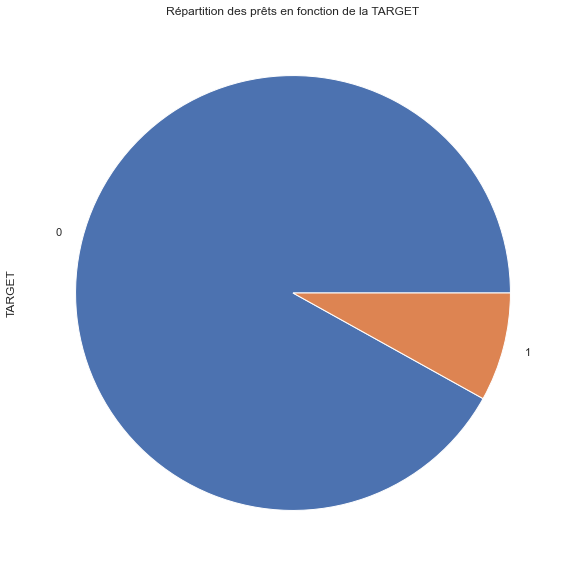

In [29]:
# Répartition des prêts en fonction de la TARGET
df_application_train['TARGET'].value_counts().plot(kind="pie", title="Répartition des prêts en fonction de la TARGET", figsize=(10, 10))
plt.show()

In [30]:
t_0 = ((df_application_train['TARGET'] == 0).sum() / df_application_train.shape[0]) * 100
t_1 = ((df_application_train['TARGET'] == 1).sum() / df_application_train.shape[0]) * 100

In [31]:
print(f"Le pourcentage des clients des client qui ont une capacité suffisante pour rembourser leurs prêts est {t_0}%")
print(f"Le pourcentage des clients des client qui n'ont pas de capacité suffisante pour rembourser leurs prêts est {t_1}%")

Le pourcentage des clients des client qui ont une capacité suffisante pour rembourser leurs prêts est 91.92711805431351%
Le pourcentage des clients des client qui n'ont pas de capacité suffisante pour rembourser leurs prêts est 8.072881945686495%


### Détermination des features importants et pertinents

- *Utilisation du* **kaggle kernels jsaguiar/lightgbm-with-simple-features**

##### START function main #####
Train samples: 10000, test samples: 10000
Bureau df shape: (2011, 108)
Process bureau and bureau_balance - done in 0s
Previous applications df shape: (9734, 242)
Process previous_applications - done in 0s
Pos-cash balance df shape: (9494, 15)
Process POS-CASH balance - done in 0s
Installments payments df shape: (8893, 26)
Process installments payments - done in 0s
Credit card balance df shape: (9520, 131)
Process credit card balance - done in 0s
Starting LightGBM. Train shape: (10000, 768), test shape: (10000, 768)
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1
[200]	training's auc: 0.844837	training's binary_logloss: 0.211008	valid_1's auc: 0.761639	valid_1's binary_logloss: 0.265962
[400]	training's auc: 0.88292	training's binary_logloss: 0.192999	valid_1's auc: 0.762533	valid_1's binary_logloss: 0.264988
Fold  1 AUC : 0.765036
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthr

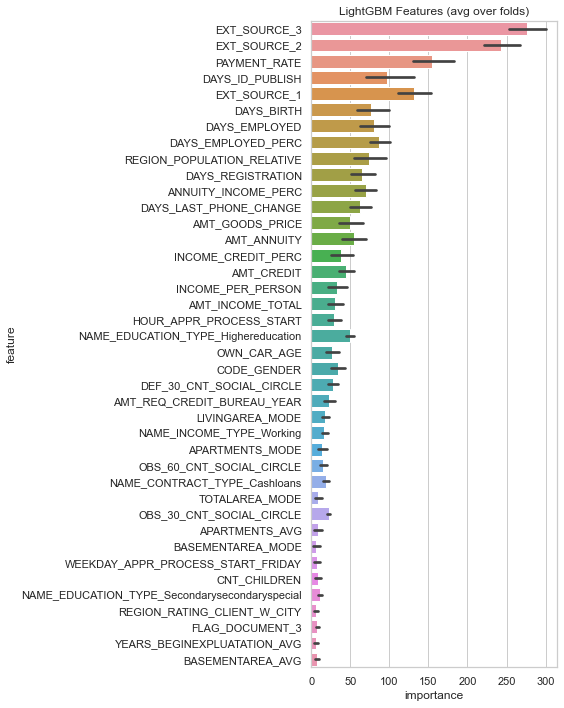

In [32]:
if __name__ == "__main__":
    submission_file_name = "submission_kernel02.csv"
    with timer("Full model run"):
        feat_importance, df = main(debug = True)

In [33]:
df.shape

(20000, 768)

- **EDA après jointure des tables**

In [34]:
# Tri par importance décroissant
feat_importance.sort_values(by='importance', ascending=False, inplace=True)

In [35]:
# Dimensions
feat_importance.shape

(7650, 3)

In [36]:
# Affichage des 100 premières lignes
feat_importance.head(100)

,feature,importance,fold
32,EXT_SOURCE_3,344,1
32,EXT_SOURCE_3,338,3
31,EXT_SOURCE_2,320,3
31,EXT_SOURCE_2,305,1
32,EXT_SOURCE_3,298,7
32,EXT_SOURCE_3,275,10
32,EXT_SOURCE_3,274,6
32,EXT_SOURCE_3,269,4
32,EXT_SOURCE_3,257,5
242,PAYMENT_RATE,252,1


In [37]:
# Nombre d'occurence pour chaque modalité de la variabke "feature"
feat_importance["feature"].value_counts()

EXT_SOURCE_3                                                       10
BURO_MONTHS_BALANCE_SIZE_MEAN                                      10
BURO_AMT_CREDIT_MAX_OVERDUE_MEAN                                   10
BURO_CREDIT_DAY_OVERDUE_MEAN                                       10
BURO_CREDIT_DAY_OVERDUE_MAX                                        10
BURO_DAYS_CREDIT_UPDATE_MEAN                                       10
BURO_DAYS_CREDIT_ENDDATE_MEAN                                      10
BURO_DAYS_CREDIT_ENDDATE_MAX                                       10
BURO_DAYS_CREDIT_ENDDATE_MIN                                       10
BURO_DAYS_CREDIT_VAR                                               10
BURO_MONTHS_BALANCE_MAX_MAX                                        10
BURO_MONTHS_BALANCE_SIZE_SUM                                       10
BURO_AMT_CREDIT_SUM_MEAN                                           10
BURO_CREDIT_TYPE_Consumercredit_MEAN                               10
BURO_STATUS_0_MEAN_M

In [38]:
# Suppression des doublons pour ne garder que celle qui la plus grande importance
feat_importance.drop_duplicates(subset='feature', keep='first', inplace=True)

In [39]:
# Dimensions
feat_importance.shape

(765, 3)

In [40]:
# Affichage des 100 premières lignes
feat_importance.head(100)

,feature,importance,fold
32,EXT_SOURCE_3,344,1
31,EXT_SOURCE_2,320,3
242,PAYMENT_RATE,252,1
12,DAYS_ID_PUBLISH,224,1
30,EXT_SOURCE_1,190,1
9,DAYS_BIRTH,155,3
10,DAYS_EMPLOYED,140,1
238,DAYS_EMPLOYED_PERC,127,1
8,REGION_POPULATION_RELATIVE,120,1
11,DAYS_REGISTRATION,113,3


In [41]:
# Types et taux de remplissage
feat_importance.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 765 entries, 32 to 362
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   feature     765 non-null    object
 1   importance  765 non-null    int32 
 2   fold        765 non-null    int64 
dtypes: int32(1), int64(1), object(1)
memory usage: 20.9+ KB


In [42]:
# Liste des features catégorielles
df_features_cat = [col for col in feat_importance.columns if feat_importance[col].dtypes == 'O']
print(f"Le DataFrame df a {feat_importance.shape[1]} features dont {len(df_features_cat)} catégorielles")

# Liste des features numériques
df_features_num = [col for col in feat_importance.columns if feat_importance[col].dtypes != 'O']
print(f"Le DataFrame df a {feat_importance.shape[1]} features dont {len(df_features_num)} numériques")

Le DataFrame df a 3 features dont 1 catégorielles
Le DataFrame df a 3 features dont 2 numériques


In [43]:
# Nombre de valeurs uniques pour chaque feature
feat_importance.nunique()

feature       765
importance     53
fold           10
dtype: int64

In [44]:
# Nombre de valeurs manquantes pour chaque feature
feat_importance.isna().sum()

feature       0
importance    0
fold          0
dtype: int64

In [45]:
# Statistiques descriptives
feat_importance.describe()

,importance,fold
count,765.000000,765.000000
mean,5.147712,6.675817
std,26.613638,1.775194
min,0.000000,1.000000
25%,0.000000,7.000000
50%,0.000000,7.000000
75%,0.000000,8.000000
max,344.000000,10.000000


In [46]:
# La matrice de corrélation
feat_importance.corr()

,importance,fold
importance,1.000000,-0.505181
fold,-0.505181,1.000000


In [47]:
'''
# Initialisation de la taille de la figure
plt.figure(figsize=(30,30))

# Génération d'un masque pour n'afficher que le triangle du bas
mask = np.triu(np.ones_like(df.corr(), dtype=bool))

# Génération de la heatmap
sns.heatmap(df.corr(), cmap='coolwarm', mask=mask, annot=True, vmin=-1, vmax=1)
plt.title("Coefficients de Correlation des Features")
plt.show()
'''

'\n# Initialisation de la taille de la figure\nplt.figure(figsize=(30,30))\n\n# Génération d\'un masque pour n\'afficher que le triangle du bas\nmask = np.triu(np.ones_like(df.corr(), dtype=bool))\n\n# Génération de la heatmap\nsns.heatmap(df.corr(), cmap=\'coolwarm\', mask=mask, annot=True, vmin=-1, vmax=1)\nplt.title("Coefficients de Correlation des Features")\nplt.show()\n'

In [48]:
# Doublons
feat_importance.duplicated().sum()

0

In [49]:
# Suppression de toutes le variables ayant un taux de remplissage < 60%
#df_TR_inf_60 =  supprimer_variables_TR(feat_importance, TR=0.6)

In [50]:
# Les dimensions
#df_TR_inf_60.shape

In [51]:
# Affichage des 5 premières lignes
#df_TR_inf_60.head()

In [52]:
# Types et taux de remplissage
#df_TR_inf_60.info()

In [53]:
# Liste des features catégorielles
#df_TR_inf_60_features_cat = [col for col in df_TR_inf_60.columns if df_TR_inf_60[col].dtypes == 'O']
#print(f"Le DataFrame df a {df_TR_inf_60.shape[1]} features dont {len(df_TR_inf_60_features_cat)} catégorielles")

# Liste des features numériques
#df_TR_inf_60_features_num = [col for col in df_TR_inf_60.columns if df_TR_inf_60[col].dtypes != 'O']
#print(f"Le DataFrame df a {df_TR_inf_60.shape[1]} features dont {len(df_TR_inf_60_features_num)} numériques")

In [54]:
# Nombre de valeurs uniques pour chaque feature
#df_TR_inf_60.nunique()

In [55]:
# Nombre de valeurs manquantes pour chaque feature
#df_TR_inf_60.isna().sum()

In [56]:
# Suppression des valeurs manquantes
#df_TR_inf_60.dropna(how="any", inplace=True)

In [57]:
# Dimensions après suppression des valeurs manquantes (Stratégie: toutes les lignes contenant au moins un NaN)
#df_TR_inf_60.shape

In [58]:
# Tous les features de df_TR_inf_60
#considered_features = df_TR_inf_60.columns
#considered_features

- **Implémentation de la méthode de filtre VIF (Variance Inflation Factor)**

In [59]:
'''
# Calcul de VIF pour tous les features
def compute_vif(considered_features):
    
    X = df_TR_inf_60[considered_features]
    
    # Le calcul de VIF requiert une constante
    X['Intercept'] = 1
    
    # create dataframe to store vif values
    # Création du DataFrame pour stocker les valeurs de VIF
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='Intercept']
    
    return vif
'''

'\n# Calcul de VIF pour tous les features\ndef compute_vif(considered_features):\n    \n    X = df_TR_inf_60[considered_features]\n    \n    # Le calcul de VIF requiert une constante\n    X[\'Intercept\'] = 1\n    \n    # create dataframe to store vif values\n    # Création du DataFrame pour stocker les valeurs de VIF\n    vif = pd.DataFrame()\n    vif["Variable"] = X.columns\n    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]\n    vif = vif[vif[\'Variable\']!=\'Intercept\']\n    \n    return vif\n'

In [60]:
# Calcul VIF
#vif_df = compute_vif(considered_features)
#vif_df

In [61]:
# Nombre de valeurs manquantes par colonne
#vif_df.isna().sum() 

In [62]:
# Suppression des valeurs manquantes
#vif_df.dropna(how="any", inplace=True)

In [63]:
# Dimensions après suppression des valeurs manquantes (Stratégie: toutes les lignes contenant au moins un NaN)
#vif_df.shape

In [64]:
# Nombre de valeurs infinies du feature VIF
#vif_df[vif_df["VIF"] == np.inf]["VIF"].count()

In [65]:
# Suppression de toutes les lignes où VIF = np.inf
#vif_df = vif_df[~(vif_df["VIF"] == np.inf)]

# Tri par ordre descendant selon les valeurs de VIF
#if_df.sort_values("VIF", ascending=False, inplace=True)

In [66]:
# Réindexation par réinitilisation du Datarame
#vif_df.reset_index()
#vif_df

In [67]:
# Récupération de l'index de la première ligne
#vif_df["VIF"][:1].index[0]

In [68]:
# Dimensions initiales de vif_df
#vif_df.shape

In [69]:
# Suppression de la première ligne si VIF > 5
#if vif_df["VIF"][:1].values[0] > 5:
    #vif_df.drop(vif_df["VIF"][:1].index[0], inplace=True)

In [70]:
# Dimensions initiales de vif_df après suppression de la première ligne 
#vif_df.shape

## AUTOMATISATION :
*Implémentation d'une fonction qui donne la liste de N features les plus pertinents (importants) selon leurs VIF*

In [71]:
'''
def process_vif_df(considered_features):   
    # Calcul de VIF 
    vif_df = compute_vif(considered_features)

    # Suppression des valeurs manquantes
    vif_df.dropna(how="any", inplace=True)

    # Suppression de toutes les lignes où VIF = np.inf
    vif_df = vif_df[~(vif_df["VIF"] == np.inf)]

    # Tri par ordre descendant selon les valeurs de VIF
    vif_df.sort_values("VIF", ascending=False, inplace=True)
    
    return vif_df



def best_features_VIF(vif_df, N):
    while vif_df["VIF"][:1].values[0] > 5 & vif_df.shape[0] != 0:
        
        # Suppression de la première ligne
        vif_df.drop(vif_df["VIF"][:1].index[0], inplace=True)
        
        considered_features = vif_df["Variable"].to_list()
        
        if vif_df.shape[0] <= N:
            return vif_df
        else:
            # Processing de vif_df
            vif_df = process_vif_df(considered_features)
    
    return vif_df
    '''

'\ndef process_vif_df(considered_features):   \n    # Calcul de VIF \n    vif_df = compute_vif(considered_features)\n\n    # Suppression des valeurs manquantes\n    vif_df.dropna(how="any", inplace=True)\n\n    # Suppression de toutes les lignes où VIF = np.inf\n    vif_df = vif_df[~(vif_df["VIF"] == np.inf)]\n\n    # Tri par ordre descendant selon les valeurs de VIF\n    vif_df.sort_values("VIF", ascending=False, inplace=True)\n    \n    return vif_df\n\n\n\ndef best_features_VIF(vif_df, N):\n    while vif_df["VIF"][:1].values[0] > 5 & vif_df.shape[0] != 0:\n        \n        # Suppression de la première ligne\n        vif_df.drop(vif_df["VIF"][:1].index[0], inplace=True)\n        \n        considered_features = vif_df["Variable"].to_list()\n        \n        if vif_df.shape[0] <= N:\n            return vif_df\n        else:\n            # Processing de vif_df\n            vif_df = process_vif_df(considered_features)\n    \n    return vif_df\n    '

#### IMPLEMENTATION

In [72]:
'''
# Calcul de VIF pour tous les features
def compute_vif(df, considered_features):
    
    X = df[considered_features]
    
    # Le calcul de VIF requiert une constante
    X['Intercept'] = 1
    
    # create dataframe to store vif values
    # Création du DataFrame pour stocker les valeurs de VIF
    vif = pd.DataFrame()
    vif["Variable"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif[vif['Variable']!='Intercept']
  
    return vif
'''

'\n# Calcul de VIF pour tous les features\ndef compute_vif(df, considered_features):\n    \n    X = df[considered_features]\n    \n    # Le calcul de VIF requiert une constante\n    X[\'Intercept\'] = 1\n    \n    # create dataframe to store vif values\n    # Création du DataFrame pour stocker les valeurs de VIF\n    vif = pd.DataFrame()\n    vif["Variable"] = X.columns\n    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]\n    vif = vif[vif[\'Variable\']!=\'Intercept\']\n  \n    return vif\n'

In [73]:
'''
# Preprocessing du DataFrame résultant de la fonction 'compute_vif'
def process_vif_df(vif):   
   
    # Suppression des valeurs manquantes
    vif.dropna(how="any", inplace=True)

    # Suppression de toutes les lignes où VIF = np.inf
    vif = vif[~(vif["VIF"] == np.inf)]

    # Tri par ordre descendant selon les valeurs de VIF
    vif.sort_values("VIF", ascending=False, inplace=True)
  
    return vif
'''

'\n# Preprocessing du DataFrame résultant de la fonction \'compute_vif\'\ndef process_vif_df(vif):   \n   \n    # Suppression des valeurs manquantes\n    vif.dropna(how="any", inplace=True)\n\n    # Suppression de toutes les lignes où VIF = np.inf\n    vif = vif[~(vif["VIF"] == np.inf)]\n\n    # Tri par ordre descendant selon les valeurs de VIF\n    vif.sort_values("VIF", ascending=False, inplace=True)\n  \n    return vif\n'

In [74]:
'''
# Rétourne le DataFrame après suppression de la première si VIF > 5 ligne et la liste de ses features
def drop_first_row_vif_sup_5(vif_preprocessed):
    if(vif_preprocessed["VIF"][:1].values[0] > 5):
        # Suppression de la première ligne
        vif_minus_first_row_df = vif_preprocessed.drop(vif_preprocessed["VIF"][:1].index[0])
        
        vif_minus_first_row_df_features = vif_minus_first_row_df["Variable"].to_list()
        
        return vif_minus_first_row_df, vif_minus_first_row_df_features
    else:
        vif_preprocessed_features = vif_preprocessed["Variable"].to_list()
        return vif_preprocessed, vif_preprocessed_features
'''

'\n# Rétourne le DataFrame après suppression de la première si VIF > 5 ligne et la liste de ses features\ndef drop_first_row_vif_sup_5(vif_preprocessed):\n    if(vif_preprocessed["VIF"][:1].values[0] > 5):\n        # Suppression de la première ligne\n        vif_minus_first_row_df = vif_preprocessed.drop(vif_preprocessed["VIF"][:1].index[0])\n        \n        vif_minus_first_row_df_features = vif_minus_first_row_df["Variable"].to_list()\n        \n        return vif_minus_first_row_df, vif_minus_first_row_df_features\n    else:\n        vif_preprocessed_features = vif_preprocessed["Variable"].to_list()\n        return vif_preprocessed, vif_preprocessed_features\n'

In [75]:
'''
# Rétourne le DataFrame et la liste des N features ayant les meilleures VIF
def best_N_features_VIF(df, N):
    
    i = 1
    while (N <= df.shape[1]):        
        
        df_features = df.columns
        
        print(f"###### Itération {i} ######")
        print(f"****** Dimension de df à l'itération {i} égale : {df.shape} ******")
        
        # Calcul des VIF
        print(f"***** Calcul {i} des VIF")
        vif = compute_vif(df, df_features)
        print(f"***** La taille du Dataframe est de {vif.shape}")
        
        # Preprocessing du DataFrame vif
        print(f"***** Preprocessing {i}")
        vif_preprocessed = process_vif_df(vif)
        print(f"***** La taille du Dataframe après le preprocessing {i}, est de {vif_preprocessed.shape}")
        print(f"***** La liste de features du Dataframe après le preprocessing {i} :")
        print(vif_preprocessed["Variable"].to_list())
        
        # Suppression de la première ligne du DataFrame si VIF > 5 et retou du DataFrame et la liste de ses featurs après suppression
        print(f"***** La taille du Dataframe avant la suppression {i}, est de {vif_preprocessed.shape}")
        vif_minus_first_row_df, vif_minus_first_row_df_features = drop_first_row_vif_sup_5(vif_preprocessed)
        print(f"***** La taille du Dataframe après la suppression {i}, est de {vif_minus_first_row_df.shape}")
        
        df = df[vif_minus_first_row_df_features]
        
        #print("****  Affichage des 30 premières lignes de df : *****")
        #print(df.head(3))
        
        list_best_N_features_VIF = vif_minus_first_row_df_features
        
        i += 1
        
    return vif_minus_first_row_df, list_best_N_features_VIF         
'''

'\n# Rétourne le DataFrame et la liste des N features ayant les meilleures VIF\ndef best_N_features_VIF(df, N):\n    \n    i = 1\n    while (N <= df.shape[1]):        \n        \n        df_features = df.columns\n        \n        print(f"###### Itération {i} ######")\n        print(f"****** Dimension de df à l\'itération {i} égale : {df.shape} ******")\n        \n        # Calcul des VIF\n        print(f"***** Calcul {i} des VIF")\n        vif = compute_vif(df, df_features)\n        print(f"***** La taille du Dataframe est de {vif.shape}")\n        \n        # Preprocessing du DataFrame vif\n        print(f"***** Preprocessing {i}")\n        vif_preprocessed = process_vif_df(vif)\n        print(f"***** La taille du Dataframe après le preprocessing {i}, est de {vif_preprocessed.shape}")\n        print(f"***** La liste de features du Dataframe après le preprocessing {i} :")\n        print(vif_preprocessed["Variable"].to_list())\n        \n        # Suppression de la première ligne du Da

#### TEST

In [76]:
##vif_df, best_vid_df_features = best_N_features_VIF(df_TR_inf_60, 30)

## Modélisation

In [77]:
# Détermination des features importants et pertinents

# Rééquilibre au niveau de la répartition des données

# Imputation des valeurs manquantes


# Modélisation
  # Régression Logistique
  # KNeighborsClassifier
  # Light Gradient Boosting Machine

In [78]:
# Affichage des 40 features les plus importants
feat_importance[["feature", "importance"]].head(40)

,feature,importance
32,EXT_SOURCE_3,344
31,EXT_SOURCE_2,320
242,PAYMENT_RATE,252
12,DAYS_ID_PUBLISH,224
30,EXT_SOURCE_1,190
9,DAYS_BIRTH,155
10,DAYS_EMPLOYED,140
238,DAYS_EMPLOYED_PERC,127
8,REGION_POPULATION_RELATIVE,120
11,DAYS_REGISTRATION,113


**Préparation des données**

In [79]:
df.shape

(20000, 768)

In [80]:
# La liste des 40 features les plus importants
best_40_important_features = feat_importance["feature"][:40].to_list()
best_40_important_features

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'EXT_SOURCE_1',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'NAME_EDUCATION_TYPE_Highereducation',
 'HOUR_APPR_PROCESS_START',
 'OWN_CAR_AGE',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'LIVINGAREA_MODE',
 'NAME_INCOME_TYPE_Working',
 'APARTMENTS_MODE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'NAME_CONTRACT_TYPE_Cashloans',
 'FLOORSMIN_AVG',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'APARTMENTS_AVG',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN']

In [81]:
best_40_important_features_ = feat_importance["feature"][:43].to_list()
best_40_important_features_

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'EXT_SOURCE_1',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'NAME_EDUCATION_TYPE_Highereducation',
 'HOUR_APPR_PROCESS_START',
 'OWN_CAR_AGE',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'LIVINGAREA_MODE',
 'NAME_INCOME_TYPE_Working',
 'APARTMENTS_MODE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'NAME_CONTRACT_TYPE_Cashloans',
 'FLOORSMIN_AVG',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'APARTMENTS_AVG',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'LANDAREA_AVG',
 'NAME_EDUCATION_TYPE_Secondarysecon

In [82]:
# Suppression de la liste des features best_40_important_features_ ['NAME_EDUCATION_TYPE_Highereducation', 'NAME_CONTRACT_TYPE_Cashloans', 'NAME_EDUCATION_TYPE_Secondarysecondaryspecial']
best_40_important_features_ = [f for f in best_40_important_features_ if f not in ['NAME_EDUCATION_TYPE_Highereducation', 'NAME_CONTRACT_TYPE_Cashloans', 'NAME_EDUCATION_TYPE_Secondarysecondaryspecial']]
best_40_important_features_

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'EXT_SOURCE_1',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'OWN_CAR_AGE',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'LIVINGAREA_MODE',
 'NAME_INCOME_TYPE_Working',
 'APARTMENTS_MODE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'FLOORSMIN_AVG',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'APARTMENTS_AVG',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'LANDAREA_AVG',
 'NAME_TYPE_SUITE_Unaccompanied']

In [83]:
# Création du DataFrame data avec les 40 features les plus importants
data = df[best_40_important_features_]

In [84]:
# Les dimensions
data.shape

(20000, 40)

In [85]:
# Les 100 première lignes
data.head(100)

,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,EXT_SOURCE_1,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,OWN_CAR_AGE,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,LIVINGAREA_MODE,NAME_INCOME_TYPE_Working,APARTMENTS_MODE,OBS_60_CNT_SOCIAL_CIRCLE,FLOORSMIN_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,APARTMENTS_AVG,WEEKDAY_APPR_PROCESS_START_FRIDAY,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MEDI,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,LANDAREA_AVG,NAME_TYPE_SUITE_Unaccompanied
0,0.139376,0.262949,0.060749,-2120,0.083037,-9461,-637.0,0.067329,0.018801,-3648.0,0.121978,-1134.0,351000.0,24700.5,0.498036,406597.5,202500.0000,202500.000,10,NaN,0,2.0,1.0,0.0198,1,0.0252,2.0,0.1250,0.0149,2.0,0,0.0247,0,0.0383,0.9722,2,2,0,0.0369,1
1,NaN,0.622246,0.027598,-291,0.311267,-16765,-1188.0,0.070862,0.003541,-1186.0,0.132217,-828.0,1129500.0,35698.5,0.208736,1293502.5,135000.0000,270000.000,11,NaN,1,0.0,0.0,0.0554,0,0.0924,1.0,0.3333,0.0714,1.0,0,0.0959,0,0.0538,0.9851,1,1,0,0.0130,0
2,0.729567,0.555912,0.050000,-2531,NaN,-19046,-225.0,0.011814,0.010032,-4260.0,0.100000,-815.0,135000.0,6750.0,0.500000,135000.0,67500.0000,67500.000,9,26.0,0,0.0,0.0,NaN,1,NaN,0.0,NaN,NaN,0.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1
3,NaN,0.650442,0.094941,-2437,NaN,-19005,-3039.0,0.159905,0.008019,-9833.0,0.219900,-617.0,297000.0,29686.5,0.431748,312682.5,67500.0000,135000.000,17,NaN,1,0.0,NaN,NaN,1,NaN,2.0,NaN,NaN,2.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1
4,NaN,0.322738,0.042623,-3458,NaN,-19932,-3038.0,0.152418,0.028663,-4311.0,0.179963,-1106.0,513000.0,21865.5,0.236842,513000.0,121500.0000,121500.000,11,NaN,0,0.0,0.0,NaN,1,NaN,0.0,NaN,NaN,0.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1
5,0.621226,0.354225,0.056101,-477,NaN,-16941,-1588.0,0.093737,0.035792,-4970.0,0.277955,-2536.0,454500.0,27517.5,0.201837,490495.5,49500.0000,99000.000,16,NaN,0,0.0,1.0,NaN,0,NaN,0.0,NaN,NaN,0.0,0,NaN,0,NaN,NaN,2,2,0,NaN,0
6,0.492060,0.724000,0.026463,-619,0.774761,-13778,-3130.0,0.227174,0.035792,-1213.0,0.241526,-1562.0,1395000.0,41301.0,0.109564,1560726.0,57000.0000,171000.000,16,17.0,1,0.0,2.0,NaN,0,NaN,1.0,NaN,NaN,1.0,0,NaN,0,NaN,NaN,2,2,1,NaN,1
7,0.540654,0.714279,0.027500,-2379,NaN,-18850,-449.0,0.023820,0.003122,-4597.0,0.116875,-1070.0,1530000.0,42075.0,0.235294,1530000.0,180000.0000,360000.000,16,8.0,0,0.0,0.0,NaN,0,NaN,2.0,NaN,NaN,2.0,0,NaN,0,NaN,NaN,3,3,0,NaN,1
8,0.751724,0.205747,0.033176,-3514,0.587334,-20099,NaN,NaN,0.018634,-7427.0,0.300680,0.0,913500.0,33826.5,0.110336,1019610.0,56250.0000,112500.000,14,NaN,1,0.0,1.0,NaN,0,NaN,1.0,NaN,NaN,1.0,0,NaN,0,NaN,NaN,2,2,0,NaN,0
9,NaN,0.746644,0.050000,-3992,NaN,-14469,-2019.0,0.139540,0.019689,-14437.0,0.150000,-1673.0,405000.0,20250.0,0.333333,405000.0,135000.0000,135000.000,8,NaN,0,0.0,NaN,NaN,1,NaN,2.0,NaN,NaN,2.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1


In [86]:
# Ajout du feature TARGET
# Création du DataFrame data avec les 40 features les plus importants et la TARGET
data = df[best_40_important_features_ + ["TARGET"]] 

In [87]:
# Les dimensions
data.shape

(20000, 41)

In [88]:
# Les 100 première lignes
data.head(100)

,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,EXT_SOURCE_1,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,OWN_CAR_AGE,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,LIVINGAREA_MODE,NAME_INCOME_TYPE_Working,APARTMENTS_MODE,OBS_60_CNT_SOCIAL_CIRCLE,FLOORSMIN_AVG,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,APARTMENTS_AVG,WEEKDAY_APPR_PROCESS_START_FRIDAY,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MEDI,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,LANDAREA_AVG,NAME_TYPE_SUITE_Unaccompanied,TARGET
0,0.139376,0.262949,0.060749,-2120,0.083037,-9461,-637.0,0.067329,0.018801,-3648.0,0.121978,-1134.0,351000.0,24700.5,0.498036,406597.5,202500.0000,202500.000,10,NaN,0,2.0,1.0,0.0198,1,0.0252,2.0,0.1250,0.0149,2.0,0,0.0247,0,0.0383,0.9722,2,2,0,0.0369,1,1.0
1,NaN,0.622246,0.027598,-291,0.311267,-16765,-1188.0,0.070862,0.003541,-1186.0,0.132217,-828.0,1129500.0,35698.5,0.208736,1293502.5,135000.0000,270000.000,11,NaN,1,0.0,0.0,0.0554,0,0.0924,1.0,0.3333,0.0714,1.0,0,0.0959,0,0.0538,0.9851,1,1,0,0.0130,0,0.0
2,0.729567,0.555912,0.050000,-2531,NaN,-19046,-225.0,0.011814,0.010032,-4260.0,0.100000,-815.0,135000.0,6750.0,0.500000,135000.0,67500.0000,67500.000,9,26.0,0,0.0,0.0,NaN,1,NaN,0.0,NaN,NaN,0.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1,0.0
3,NaN,0.650442,0.094941,-2437,NaN,-19005,-3039.0,0.159905,0.008019,-9833.0,0.219900,-617.0,297000.0,29686.5,0.431748,312682.5,67500.0000,135000.000,17,NaN,1,0.0,NaN,NaN,1,NaN,2.0,NaN,NaN,2.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1,0.0
4,NaN,0.322738,0.042623,-3458,NaN,-19932,-3038.0,0.152418,0.028663,-4311.0,0.179963,-1106.0,513000.0,21865.5,0.236842,513000.0,121500.0000,121500.000,11,NaN,0,0.0,0.0,NaN,1,NaN,0.0,NaN,NaN,0.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1,0.0
5,0.621226,0.354225,0.056101,-477,NaN,-16941,-1588.0,0.093737,0.035792,-4970.0,0.277955,-2536.0,454500.0,27517.5,0.201837,490495.5,49500.0000,99000.000,16,NaN,0,0.0,1.0,NaN,0,NaN,0.0,NaN,NaN,0.0,0,NaN,0,NaN,NaN,2,2,0,NaN,0,0.0
6,0.492060,0.724000,0.026463,-619,0.774761,-13778,-3130.0,0.227174,0.035792,-1213.0,0.241526,-1562.0,1395000.0,41301.0,0.109564,1560726.0,57000.0000,171000.000,16,17.0,1,0.0,2.0,NaN,0,NaN,1.0,NaN,NaN,1.0,0,NaN,0,NaN,NaN,2,2,1,NaN,1,0.0
7,0.540654,0.714279,0.027500,-2379,NaN,-18850,-449.0,0.023820,0.003122,-4597.0,0.116875,-1070.0,1530000.0,42075.0,0.235294,1530000.0,180000.0000,360000.000,16,8.0,0,0.0,0.0,NaN,0,NaN,2.0,NaN,NaN,2.0,0,NaN,0,NaN,NaN,3,3,0,NaN,1,0.0
8,0.751724,0.205747,0.033176,-3514,0.587334,-20099,NaN,NaN,0.018634,-7427.0,0.300680,0.0,913500.0,33826.5,0.110336,1019610.0,56250.0000,112500.000,14,NaN,1,0.0,1.0,NaN,0,NaN,1.0,NaN,NaN,1.0,0,NaN,0,NaN,NaN,2,2,0,NaN,0,0.0
9,NaN,0.746644,0.050000,-3992,NaN,-14469,-2019.0,0.139540,0.019689,-14437.0,0.150000,-1673.0,405000.0,20250.0,0.333333,405000.0,135000.0000,135000.000,8,NaN,0,0.0,NaN,NaN,1,NaN,2.0,NaN,NaN,2.0,0,NaN,0,NaN,NaN,2,2,0,NaN,1,0.0


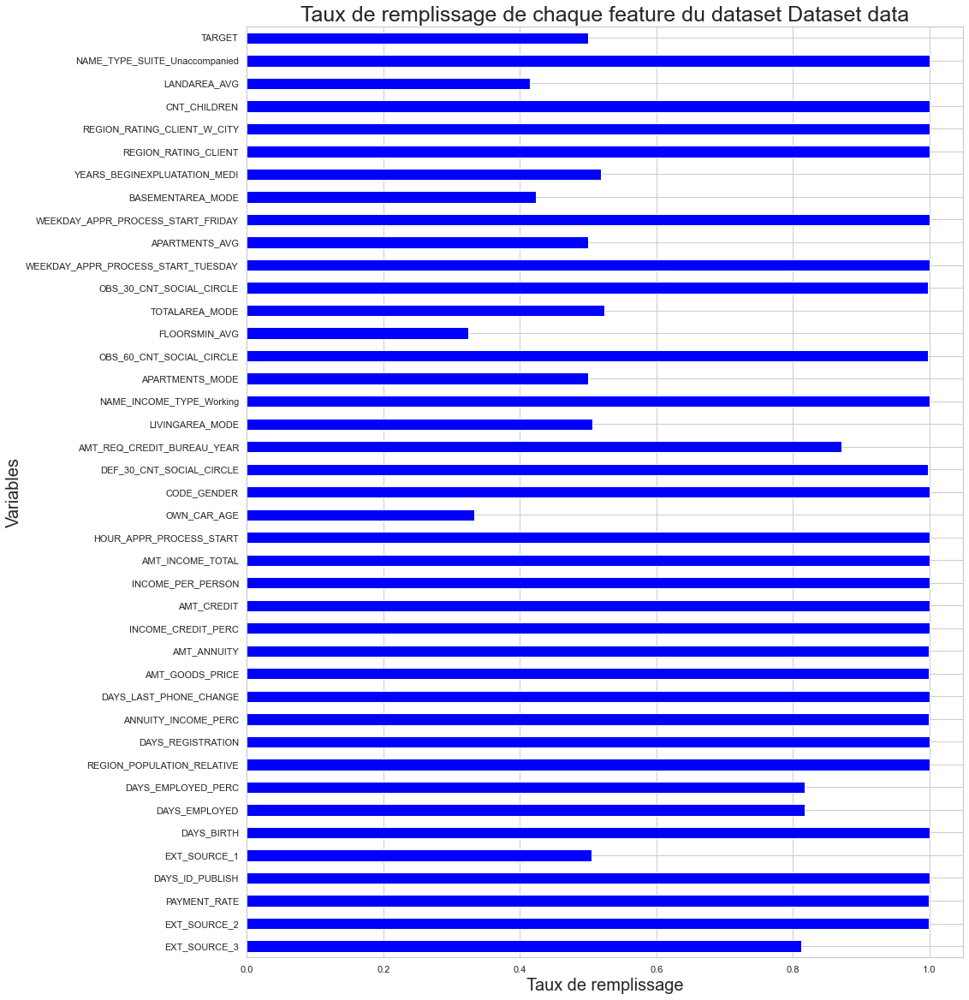

In [89]:
# Taux de remplissage de data
data.name = "Dataset data"
afficher_taux_remplissage_variables(data, largeur=15, longueur=20, titre="Taux de remplissage de chaque feature")

In [90]:
# Nombre de valeurs manquantes par feature
data.isna().sum()

EXT_SOURCE_3                           3765
EXT_SOURCE_2                             27
PAYMENT_RATE                             10
DAYS_ID_PUBLISH                           0
EXT_SOURCE_1                           9908
DAYS_BIRTH                                0
DAYS_EMPLOYED                          3657
DAYS_EMPLOYED_PERC                     3657
REGION_POPULATION_RELATIVE                0
DAYS_REGISTRATION                         0
ANNUITY_INCOME_PERC                      10
DAYS_LAST_PHONE_CHANGE                    0
AMT_GOODS_PRICE                           7
AMT_ANNUITY                              10
INCOME_CREDIT_PERC                        0
AMT_CREDIT                                0
INCOME_PER_PERSON                         0
AMT_INCOME_TOTAL                          0
HOUR_APPR_PROCESS_START                   0
OWN_CAR_AGE                           13338
CODE_GENDER                               0
DEF_30_CNT_SOCIAL_CIRCLE                 46
AMT_REQ_CREDIT_BUREAU_YEAR      

In [91]:
# Doublons
data.duplicated().sum()

0

In [92]:
# Suppression des features ayant un Taux de remplissage < 50%
data_TR_sup_50 =  supprimer_variables_TR(data, TR=0.5)

In [93]:
# Les dimensions
data_TR_sup_50.shape

(20000, 35)

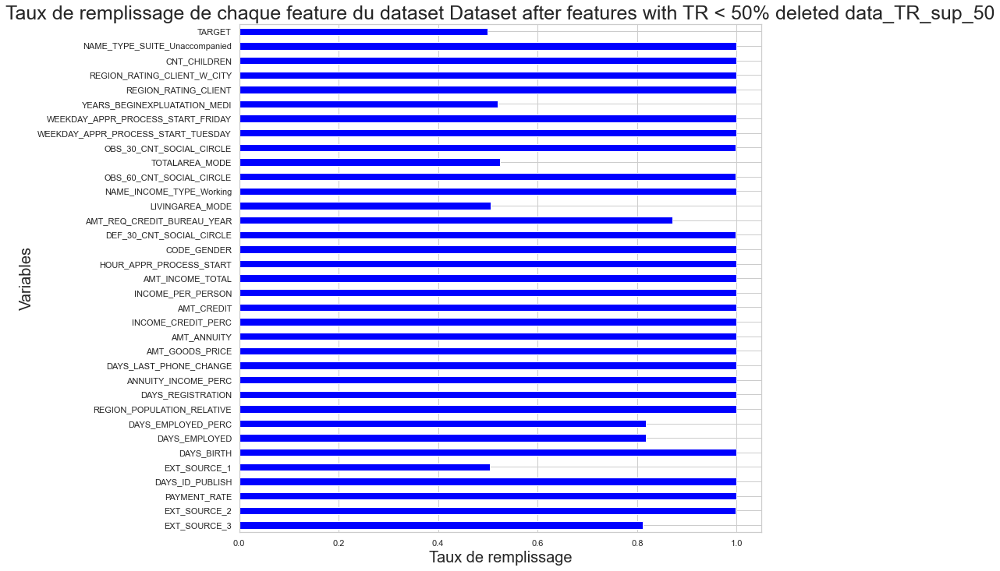

In [94]:
# Taux de remplissage de data_TR_sup_50
data_TR_sup_50.name = "Dataset after features with TR < 50% deleted data_TR_sup_50"
afficher_taux_remplissage_variables(data_TR_sup_50, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [95]:
# Suppression de toutes les lignes où TARGET = NaN
data_ = data_TR_sup_50[data_TR_sup_50['TARGET'].notna()]

In [96]:
# Les dimensions après suppression de toutes les lignes où TARGET = NaN
data_.shape

(10000, 35)

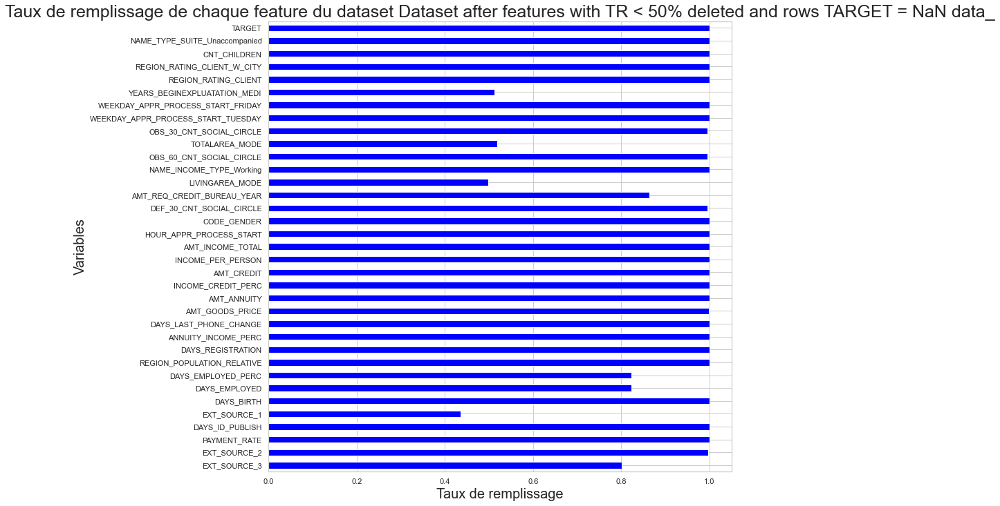

In [97]:
# Taux de remplissage de data
data_.name = "Dataset after features with TR < 50% deleted and rows TARGET = NaN data_"
afficher_taux_remplissage_variables(data_, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [98]:
# Suppression des features ayant un Taux de remplissage < 60%
data_TR_sup_60 =  supprimer_variables_TR(data_, TR=0.6)

In [99]:
# Les dimensions
data_TR_sup_60.shape

(10000, 31)

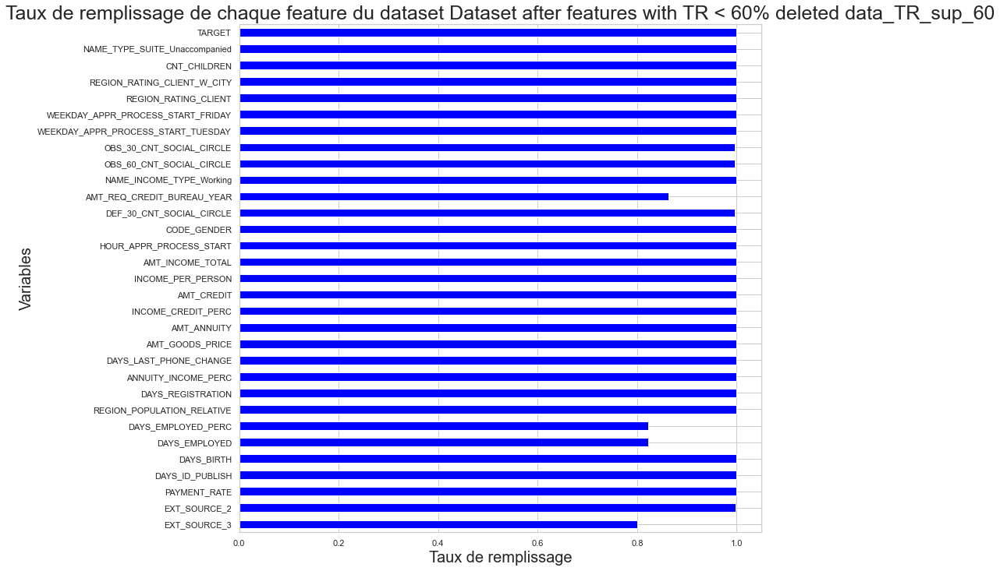

In [100]:
# Taux de remplissage de data_TR_sup_60
data_TR_sup_60.name = "Dataset after features with TR < 60% deleted data_TR_sup_60"
afficher_taux_remplissage_variables(data_TR_sup_60, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [101]:
# Suppression de toutes les lignes où EXT_SOURCE_3 = NaN
data__ = data_TR_sup_60[data_TR_sup_60['EXT_SOURCE_3'].notna()]

In [102]:
# Les dimensions après suppression de toutes les lignes où EXT_SOURCE_3 = NaN
data__.shape

(8005, 31)

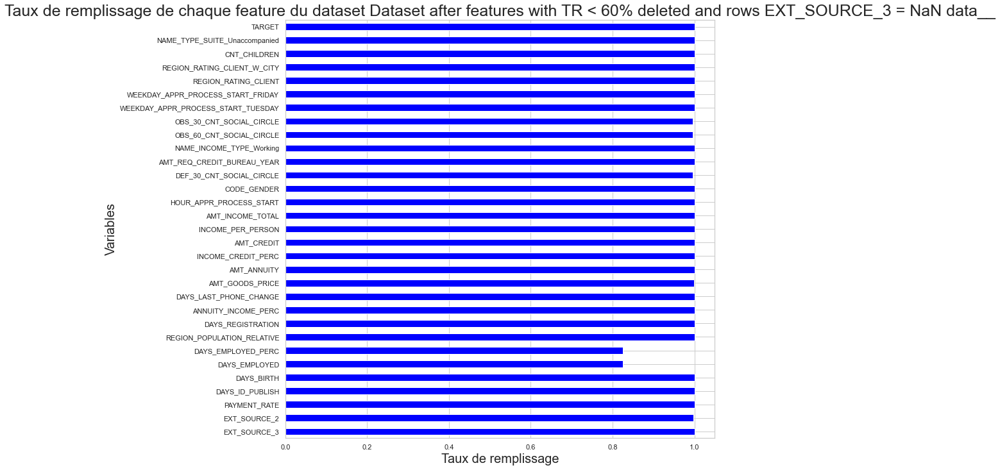

In [103]:
# Taux de remplissage de data
data__.name = "Dataset after features with TR < 60% deleted and rows EXT_SOURCE_3 = NaN data__"
afficher_taux_remplissage_variables(data__, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [104]:
# Suppression de toutes les lignes où DAYS_EMPLOYED = NaN
data_3 = data__[data__['DAYS_EMPLOYED'].notna()]

In [105]:
# Les dimensions après suppression de toutes les lignes où DAYS_EMPLOYED = NaN
data_3.shape

(6610, 31)

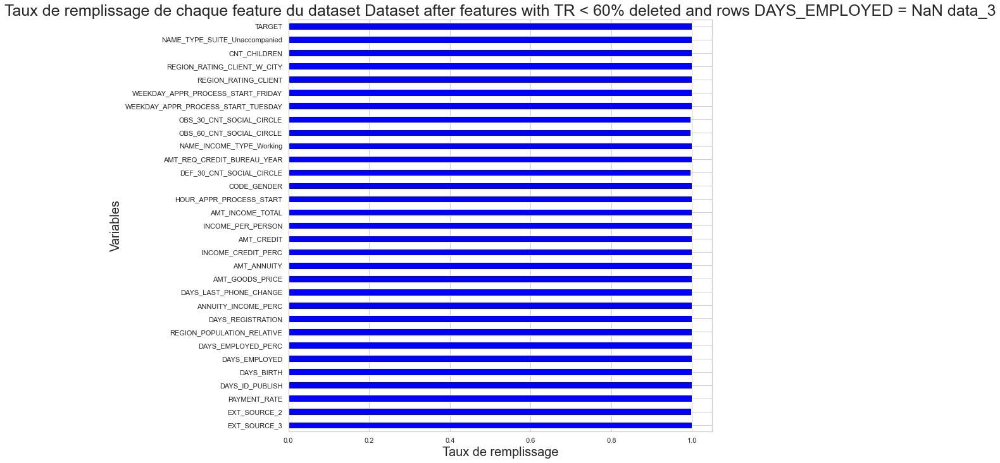

In [106]:
# Taux de remplissage de data
data_3.name = "Dataset after features with TR < 60% deleted and rows DAYS_EMPLOYED = NaN data_3"
afficher_taux_remplissage_variables(data_3, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [107]:
# Le nomber de valeurs manquantes par feature 
data_3.isna().sum()

EXT_SOURCE_3                           0
EXT_SOURCE_2                          10
PAYMENT_RATE                           0
DAYS_ID_PUBLISH                        0
DAYS_BIRTH                             0
DAYS_EMPLOYED                          0
DAYS_EMPLOYED_PERC                     0
REGION_POPULATION_RELATIVE             0
DAYS_REGISTRATION                      0
ANNUITY_INCOME_PERC                    0
DAYS_LAST_PHONE_CHANGE                 0
AMT_GOODS_PRICE                        5
AMT_ANNUITY                            0
INCOME_CREDIT_PERC                     0
AMT_CREDIT                             0
INCOME_PER_PERSON                      0
AMT_INCOME_TOTAL                       0
HOUR_APPR_PROCESS_START                0
CODE_GENDER                            0
DEF_30_CNT_SOCIAL_CIRCLE              24
AMT_REQ_CREDIT_BUREAU_YEAR             0
NAME_INCOME_TYPE_Working               0
OBS_60_CNT_SOCIAL_CIRCLE              24
OBS_30_CNT_SOCIAL_CIRCLE              24
WEEKDAY_APPR_PRO

In [108]:
# Suppression de toutes les lignes où OBS_30_CNT_SOCIAL_CIRCLE = NaN
data_4 = data_3[data_3['OBS_30_CNT_SOCIAL_CIRCLE'].notna()]

In [109]:
# Les dimensions après suppression de toutes les lignes où OBS_30_CNT_SOCIAL_CIRCLE = NaN
data_4.shape

(6586, 31)

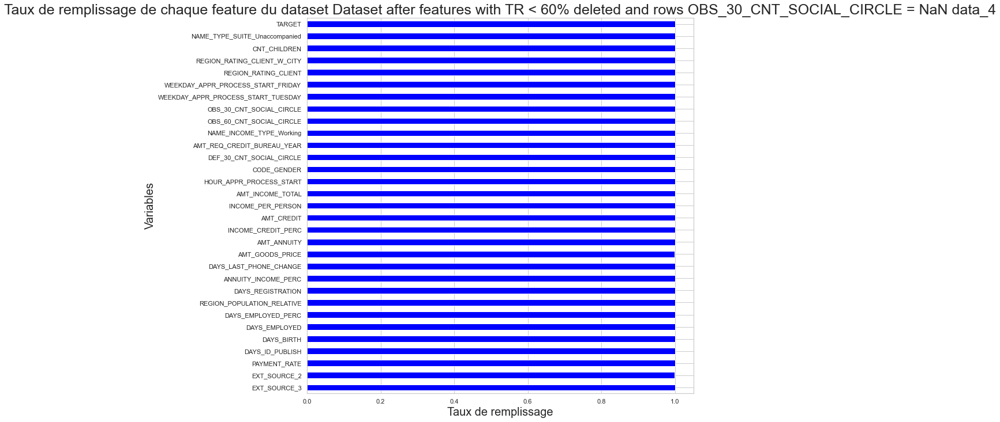

In [110]:
# Taux de remplissage de data
data_4.name = "Dataset after features with TR < 60% deleted and rows OBS_30_CNT_SOCIAL_CIRCLE = NaN data_4"
afficher_taux_remplissage_variables(data_4, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [111]:
# Le nomber de valeurs manquantes par feature 
data_4.isna().sum()

EXT_SOURCE_3                           0
EXT_SOURCE_2                          10
PAYMENT_RATE                           0
DAYS_ID_PUBLISH                        0
DAYS_BIRTH                             0
DAYS_EMPLOYED                          0
DAYS_EMPLOYED_PERC                     0
REGION_POPULATION_RELATIVE             0
DAYS_REGISTRATION                      0
ANNUITY_INCOME_PERC                    0
DAYS_LAST_PHONE_CHANGE                 0
AMT_GOODS_PRICE                        5
AMT_ANNUITY                            0
INCOME_CREDIT_PERC                     0
AMT_CREDIT                             0
INCOME_PER_PERSON                      0
AMT_INCOME_TOTAL                       0
HOUR_APPR_PROCESS_START                0
CODE_GENDER                            0
DEF_30_CNT_SOCIAL_CIRCLE               0
AMT_REQ_CREDIT_BUREAU_YEAR             0
NAME_INCOME_TYPE_Working               0
OBS_60_CNT_SOCIAL_CIRCLE               0
OBS_30_CNT_SOCIAL_CIRCLE               0
WEEKDAY_APPR_PRO

In [112]:
# Suppression de toutes les lignes où EXT_SOURCE_2 = NaN
data_5 = data_4[data_4['EXT_SOURCE_2'].notna()]

In [113]:
# Les dimensions après suppression de toutes les lignes où EXT_SOURCE_2 = NaN
data_5.shape

(6576, 31)

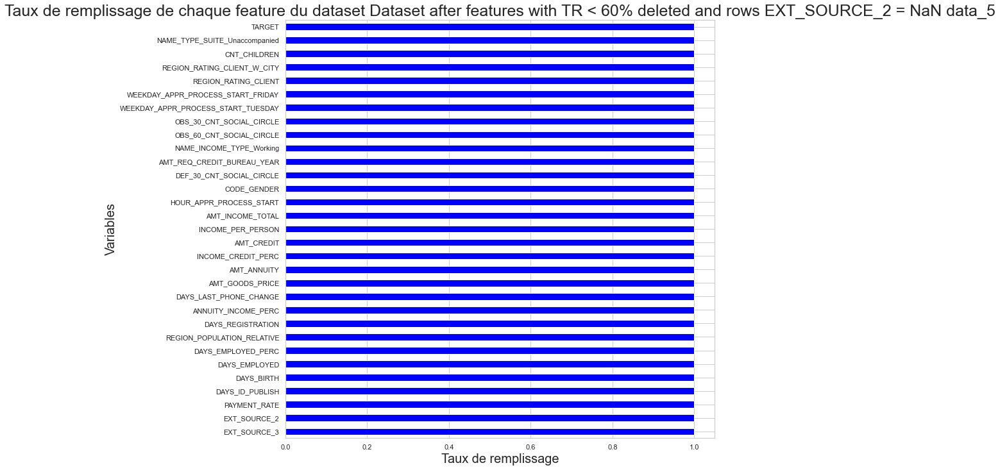

In [114]:
# Taux de remplissage de data
data_5.name = "Dataset after features with TR < 60% deleted and rows EXT_SOURCE_2 = NaN data_5"
afficher_taux_remplissage_variables(data_5, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

In [115]:
# Le nomber de valeurs manquantes par feature 
data_5.isna().sum()

EXT_SOURCE_3                          0
EXT_SOURCE_2                          0
PAYMENT_RATE                          0
DAYS_ID_PUBLISH                       0
DAYS_BIRTH                            0
DAYS_EMPLOYED                         0
DAYS_EMPLOYED_PERC                    0
REGION_POPULATION_RELATIVE            0
DAYS_REGISTRATION                     0
ANNUITY_INCOME_PERC                   0
DAYS_LAST_PHONE_CHANGE                0
AMT_GOODS_PRICE                       5
AMT_ANNUITY                           0
INCOME_CREDIT_PERC                    0
AMT_CREDIT                            0
INCOME_PER_PERSON                     0
AMT_INCOME_TOTAL                      0
HOUR_APPR_PROCESS_START               0
CODE_GENDER                           0
DEF_30_CNT_SOCIAL_CIRCLE              0
AMT_REQ_CREDIT_BUREAU_YEAR            0
NAME_INCOME_TYPE_Working              0
OBS_60_CNT_SOCIAL_CIRCLE              0
OBS_30_CNT_SOCIAL_CIRCLE              0
WEEKDAY_APPR_PROCESS_START_TUESDAY    0


In [116]:
# Suppression de toutes les lignes où AMT_GOODS_PRICE = NaN
data_6 = data_5[data_5['AMT_GOODS_PRICE'].notna()]

# Les dimensions après suppression de toutes les lignes où AMT_GOODS_PRICE = NaN
data_6.shape

(6571, 31)

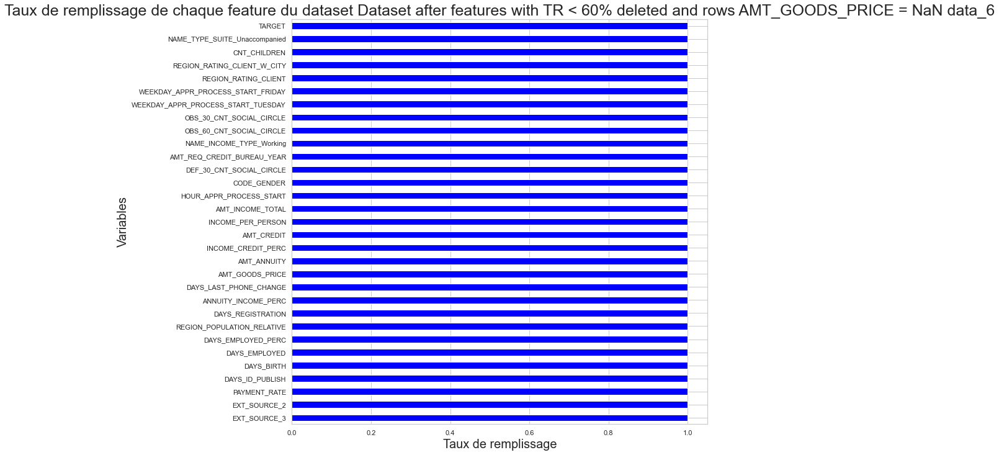

EXT_SOURCE_3                          0
EXT_SOURCE_2                          0
PAYMENT_RATE                          0
DAYS_ID_PUBLISH                       0
DAYS_BIRTH                            0
DAYS_EMPLOYED                         0
DAYS_EMPLOYED_PERC                    0
REGION_POPULATION_RELATIVE            0
DAYS_REGISTRATION                     0
ANNUITY_INCOME_PERC                   0
DAYS_LAST_PHONE_CHANGE                0
AMT_GOODS_PRICE                       0
AMT_ANNUITY                           0
INCOME_CREDIT_PERC                    0
AMT_CREDIT                            0
INCOME_PER_PERSON                     0
AMT_INCOME_TOTAL                      0
HOUR_APPR_PROCESS_START               0
CODE_GENDER                           0
DEF_30_CNT_SOCIAL_CIRCLE              0
AMT_REQ_CREDIT_BUREAU_YEAR            0
NAME_INCOME_TYPE_Working              0
OBS_60_CNT_SOCIAL_CIRCLE              0
OBS_30_CNT_SOCIAL_CIRCLE              0
WEEKDAY_APPR_PROCESS_START_TUESDAY    0


In [117]:
# Taux de remplissage de data
data_6.name = "Dataset after features with TR < 60% deleted and rows AMT_GOODS_PRICE = NaN data_6"
afficher_taux_remplissage_variables(data_6, largeur=12, longueur=12, titre="Taux de remplissage de chaque feature")

# Le nomber de valeurs manquantes par feature 
data_6.isna().sum()

In [118]:
# Les noms des features de data_6
data_6.columns

Index(['EXT_SOURCE_3', 'EXT_SOURCE_2', 'PAYMENT_RATE', 'DAYS_ID_PUBLISH',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_EMPLOYED_PERC',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION',
       'ANNUITY_INCOME_PERC', 'DAYS_LAST_PHONE_CHANGE', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'INCOME_CREDIT_PERC', 'AMT_CREDIT', 'INCOME_PER_PERSON',
       'AMT_INCOME_TOTAL', 'HOUR_APPR_PROCESS_START', 'CODE_GENDER',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'NAME_INCOME_TYPE_Working', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
       'WEEKDAY_APPR_PROCESS_START_FRIDAY', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'CNT_CHILDREN',
       'NAME_TYPE_SUITE_Unaccompanied', 'TARGET'],
      dtype='object')

In [119]:
# Le nombre de feature de data_6
data_6.shape[1]

31

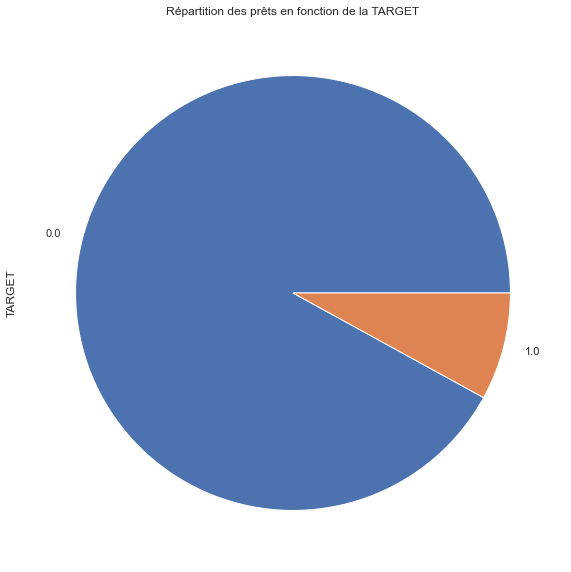

In [120]:
# Répartition des doonnées selons le feature TARGET
data_6['TARGET'].value_counts().plot(kind="pie", title="Répartition des prêts en fonction de la TARGET", figsize=(10, 10))
plt.show()

In [121]:
print(list(data_6.columns).remove('TARGET'))

None


In [122]:
# Conversion Index en liste
features_l = list(data_6.columns)
features_l

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied',
 'TARGET']

In [123]:
# Liste des features sans la TARGET
features_l.remove('TARGET')

In [124]:
features_l

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied']

In [125]:
len(features_l)

30

In [126]:
# Séparation des données pour les différents modèles
X = data_6[features_l].values
y = data_6['TARGET'].values

print(f"Longueur X = {len(X)}")
print(f"Longueur y = {len(y)}")

Longueur X = 6571
Longueur y = 6571


In [127]:
X

array([[0.13937578, 0.26294859, 0.06074927, ..., 2.        , 0.        ,
        1.        ],
       [0.72956669, 0.55591208, 0.05      , ..., 2.        , 0.        ,
        1.        ],
       [0.62122634, 0.35422473, 0.05610143, ..., 2.        , 0.        ,
        0.        ],
       ...,
       [0.52449645, 0.022644  , 0.10769718, ..., 2.        , 0.        ,
        1.        ],
       [0.30162489, 0.28683186, 0.07937513, ..., 2.        , 0.        ,
        1.        ],
       [0.11319635, 0.52056221, 0.05271618, ..., 1.        , 0.        ,
        1.        ]])

In [128]:
y

array([1., 0., 0., ..., 0., 0., 0.])

In [129]:
from sklearn.model_selection import train_test_split
# Séparation des données en training set et testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [130]:
# Description des information pour le training set et le testing set
print("Number transactions X_train dataset: ", X_train.shape)
print("Number transactions y_train dataset: ", y_train.shape)
print("Number transactions X_test dataset: ", X_test.shape)
print("Number transactions y_test dataset: ", y_test.shape)

Number transactions X_train dataset:  (4599, 30)
Number transactions y_train dataset:  (4599,)
Number transactions X_test dataset:  (1972, 30)
Number transactions y_test dataset:  (1972,)


In [131]:
# Distribution des données de TARGET
count_before_oversampling = Counter(y_train)
count_before_oversampling

Counter({0.0: 4221, 1.0: 378})

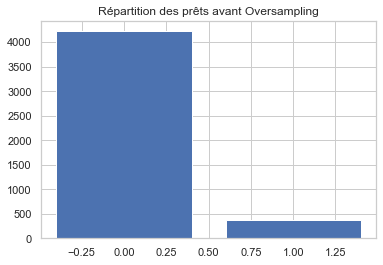

In [132]:
plt.bar(count_before_oversampling.keys(), count_before_oversampling.values())
plt.title("Répartition des prêts avant Oversampling")
plt.show()

- **Equilibrage des données**

In [133]:
print("########## Avant OverSampling ##########")
print(f"Avant OverSampling, le nombre du label '1': {(sum(y_train == 1))}")
print(f"Avant OverSampling, le nombre du label '0': {(sum(y_train == 0))}")

# Instanciation de la classe SMOTE
sm = SMOTE(random_state = 2)
X_oversampled, y_oversampled = sm.fit_resample(X_train, y_train.ravel())

print()
  
print("########## Après OverSampling ##########")
print(f"Après OverSampling, les dimensions de train_X: {X_oversampled.shape}")
print(f"Après OverSampling, les dimensions de train_y: {y_oversampled.shape}")
  
print(f"Après OverSampling, le nombre du label '1': {sum(y_oversampled == 1)}")
print(f"Après OverSampling, le nombre du label '0': {sum(y_oversampled == 0)}")

print()

X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(X_oversampled, y_oversampled, test_size = 0.3, random_state = 0)# Description des information pour le training set et le testing set

# Description des information pour le training set et le testing set après Oversampling
print("Number transactions X_train_res dataset: ", X_train_res.shape)
print("Number transactions y_train_res dataset: ", y_train_res.shape)
print("Number transactions X_test_res dataset: ", X_test_res.shape)
print("Number transactions y_test_res dataset: ", y_test_res.shape)

########## Avant OverSampling ##########
Avant OverSampling, le nombre du label '1': 378
Avant OverSampling, le nombre du label '0': 4221

########## Après OverSampling ##########
Après OverSampling, les dimensions de train_X: (8442, 30)
Après OverSampling, les dimensions de train_y: (8442,)
Après OverSampling, le nombre du label '1': 4221
Après OverSampling, le nombre du label '0': 4221

Number transactions X_train_res dataset:  (5909, 30)
Number transactions y_train_res dataset:  (5909,)
Number transactions X_test_res dataset:  (2533, 30)
Number transactions y_test_res dataset:  (2533,)


In [134]:
X_train_res

array([[0.45074728, 0.55235164, 0.04734696, ..., 2.        , 0.        ,
        0.        ],
       [0.27350457, 0.53113455, 0.04875992, ..., 2.21847082, 1.56305836,
        0.21847082],
       [0.27356468, 0.68607637, 0.04072632, ..., 1.        , 1.        ,
        1.        ],
       ...,
       [0.58091398, 0.22868288, 0.04307387, ..., 2.        , 0.85702737,
        1.        ],
       [0.8482443 , 0.63919379, 0.03316474, ..., 2.        , 1.        ,
        1.        ],
       [0.57444662, 0.56250962, 0.0793    , ..., 2.        , 0.        ,
        1.        ]])

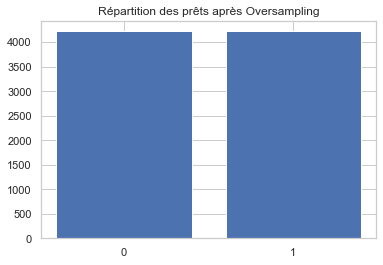

In [135]:
# Distribution des données de TARGET après Oversampling avec SMOTE
X_sum_1 = sum(y_oversampled == 1)
Y_sum_0 = sum(y_oversampled == 0)

dict_X_1_Y_0 = {'0': Y_sum_0, '1': X_sum_1}
keys = dict_X_1_Y_0.keys()
values = dict_X_1_Y_0.values()

plt.bar(keys, values)
plt.title("Répartition des prêts après Oversampling")
plt.show()

## MODELISATION

#### Baseline avant Oversampling : Dummy Classifier

In [136]:
dummyClf = DummyClassifier()
dummyClf.fit(X_train, y_train)
accuracy = dummyClf.score(X_test, y_test)
print(f"L'accuracy du modèle DummyClassifier avant Oversampling est : {accuracy}")

L'accuracy du modèle DummyClassifier avant Oversampling est : 0.9254563894523327


## Implémentation de la fonction :
**run_model_clf** avec intégration de multiple métriques d'évaluation de performance

In [137]:
# La fonction prend comme arguments le training set, l'estimateur, une liste de scaler, grille de paramètres, pipeline, nombre
# folds et log = 1 si on passe des features au logarithme 
# retourne un DataFrame avec les meilleurs scores

RES_ALL = pd.DataFrame()
RES_BEST = pd.DataFrame()
scorers = ['accuracy', 'average_precision', 'roc_auc']

def run_model_clf(X, X_name, y, estimator_name, param_grid, log, pipeline_, n_folds=5, scorers=scorers):
    
    global RES_ALL, RES_BEST
    
    if not scorers:    
        grid = GridSearchCV(pipeline_, param_grid, cv=n_folds, verbose=1, n_jobs=-1, refit='roc_auc')
        if log == 1:
            grid.fit(X, np.log(y))
        else : 
            grid.fit(X, y)
    else:
        grid = GridSearchCV(pipeline_, param_grid, scoring=scorers, cv=n_folds, verbose=1, n_jobs=-1, refit='roc_auc')
        grid.fit(X, y)
    
    res = pd.DataFrame(grid.cv_results_)
    cols = [i for i in res.columns if "split" not in i]
    res = res[cols]
    
    res['Target_Log'] = 1 if log == 1 else 0
    res['X_name'] = X_name
    res['Estimator_Name'] = estimator_name   
    
    #res = res.sort_values(by='mean_test_roc_auc', ascending=False)
    #res = res.sort_values(by=['mean_test_roc_auc', 'mean_test_accuracy', 'mean_test_average_precision'], ascending=False)
    res.sort_values(by=['mean_test_roc_auc', 'mean_test_accuracy', 'mean_test_average_precision'], ascending=False, inplace=True)
  
    RES_ALL = pd.concat([RES_ALL, res], axis=0, ignore_index=True)
    RES_BEST = pd.concat([RES_BEST, res.head(1)], axis=0, ignore_index=True)
     
    return res

### Light GBM

In [138]:
# Définition du modèle
#estimator = LGBMClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
#estimator.get_params().keys()

In [139]:
'''
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]

# LightGBM parameters found by Bayesian optimization
nthread = 4
n_estimators = 10000
learning_rate = 0.02
num_leaves = 34
colsample_bytree = 0.9497036
subsample = 0.8715623
max_depth = 8
reg_alpha = 0.041545473
reg_lambda = 0.0735294
min_split_gain = 0.0222415
min_child_weight = 39.3259775
silent = -1
verbose = -1

# Initialisation de param_grid
param_grid = {'estimator__nthread': nthread,
              'estimator__n_estimators': n_estimators,
              'estimator__learning_rate': learning_rate, 
              'estimator__num_leaves': num_leaves,
              'estimator__colsample_bytree': colsample_bytree,
              'estimator__subsample': subsample,
              'estimator__max_depth': max_depth,
              'estimator__reg_alpha': reg_alpha,
              'estimator__reg_lambda': reg_lambda,
              'estimator__min_split_gain': min_split_gain,
              'estimator__min_child_weight': min_child_weight,
              'estimator__silent': silent,
              'estimator__verbose': verbose,
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])
'''

'\n# Initialisation des paramètres et hyperparamètres\nscaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),\n               Normalizer(), PowerTransformer(), "passtrough"]\n\n# LightGBM parameters found by Bayesian optimization\nnthread = 4\nn_estimators = 10000\nlearning_rate = 0.02\nnum_leaves = 34\ncolsample_bytree = 0.9497036\nsubsample = 0.8715623\nmax_depth = 8\nreg_alpha = 0.041545473\nreg_lambda = 0.0735294\nmin_split_gain = 0.0222415\nmin_child_weight = 39.3259775\nsilent = -1\nverbose = -1\n\n# Initialisation de param_grid\nparam_grid = {\'estimator__nthread\': nthread,\n              \'estimator__n_estimators\': n_estimators,\n              \'estimator__learning_rate\': learning_rate, \n              \'estimator__num_leaves\': num_leaves,\n              \'estimator__colsample_bytree\': colsample_bytree,\n              \'estimator__subsample\': subsample,\n              \'estimator__max_depth\': max_depth,\n              \'es

In [140]:
# Log_TARGERT == 0
#run_model_clf(X_train, "X_train", y_train, "LGBMClassifier before Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

In [141]:
# Log_TARGERT == 1
#run_model_clf(X_train, "X_train", y_train, "LGBMClassifier before Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

### Logistic Regression 

In [142]:
# Définition du modèle
estimator = LogisticRegression()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])

In [143]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalties = [None, 'l1', 'l2', 'elasticnet']
c_values = [100, 10, 1.0, 0.1, 0.01]

# Initialisation de param_grid
param_grid = {'estimator__solver': solvers,
              'scaler': scaler_list, 
              'estimator__penalty': penalties,
              'estimator__C': c_values}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [144]:
# Log_TARGET == 0
run_model_clf(X_train, "X_train", y_train, "Logistic Regression before Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__C,param_estimator__penalty,param_estimator__solver,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
340,0.027868,4.379444e-04,0.003839,0.000428,0.1,l2,newton-cg,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.249234,0.041297,15,0.760013,0.026048,1,0,X_train,Logistic Regression before Oversampling
348,0.018981,9.458385e-04,0.003608,0.000721,0.1,l2,lbfgs,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.249217,0.041287,16,0.760010,0.026046,2,0,X_train,Logistic Regression before Oversampling
356,0.015370,8.963118e-04,0.003096,0.000388,0.1,l2,liblinear,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.247417,0.038193,51,0.759983,0.025427,3,0,X_train,Logistic Regression before Oversampling
347,0.019956,1.828662e-03,0.004318,0.000519,0.1,l2,lbfgs,MinMaxScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.246857,0.044852,64,0.758965,0.027712,4,0,X_train,Logistic Regression before Oversampling
339,0.034757,8.242137e-03,0.003555,0.000389,0.1,l2,newton-cg,MinMaxScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.246856,0.044851,65,0.758961,0.027708,5,0,X_train,Logistic Regression before Oversampling
236,0.052765,1.003987e-02,0.003390,0.000488,1.0,l1,liblinear,MaxAbsScaler(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.917591,0.001720,78,0.254183,0.044684,1,0.758673,0.027923,6,0,X_train,Logistic Regression before Oversampling
235,0.071289,2.845916e-02,0.004003,0.000781,1.0,l1,liblinear,MinMaxScaler(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.917809,0.001608,2,0.253387,0.043270,2,0.757615,0.026851,7,0,X_train,Logistic Regression before Oversampling
355,0.015749,1.404433e-03,0.003102,0.000581,0.1,l2,liblinear,MinMaxScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.248106,0.042369,32,0.757507,0.025203,8,0,X_train,Logistic Regression before Oversampling
260,0.023111,1.346915e-03,0.003889,0.000491,1.0,l2,liblinear,MaxAbsScaler(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.917591,0.001720,78,0.250693,0.044522,7,0.757423,0.029357,9,0,X_train,Logistic Regression before Oversampling
334,0.237449,9.002197e-03,0.010781,0.001611,0.1,l1,liblinear,PowerTransformer(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917156,0.000427,125,0.246513,0.049516,66,0.757316,0.029875,10,0,X_train,Logistic Regression before Oversampling


In [145]:
# Log_TARGET == 1
run_model_clf(X_train, "X_train", y_train, "Logistic Regression before Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__C,param_estimator__penalty,param_estimator__solver,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
340,0.034932,2.912601e-03,0.004431,0.000476,0.1,l2,newton-cg,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.249234,0.041297,15,0.760013,0.026048,1,1,X_train,Logistic Regression before Oversampling
348,0.018002,1.221866e-03,0.004438,0.000339,0.1,l2,lbfgs,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.249217,0.041287,16,0.760010,0.026046,2,1,X_train,Logistic Regression before Oversampling
356,0.016569,1.106643e-03,0.003892,0.000196,0.1,l2,liblinear,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.247417,0.038193,52,0.759983,0.025427,3,1,X_train,Logistic Regression before Oversampling
347,0.020918,1.535902e-03,0.004396,0.000488,0.1,l2,lbfgs,MinMaxScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.246857,0.044852,64,0.758965,0.027712,4,1,X_train,Logistic Regression before Oversampling
339,0.035554,2.399682e-03,0.005319,0.001282,0.1,l2,newton-cg,MinMaxScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.246856,0.044851,65,0.758961,0.027708,5,1,X_train,Logistic Regression before Oversampling
236,0.080734,3.245355e-02,0.003997,0.000315,1.0,l1,liblinear,MaxAbsScaler(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.917591,0.001720,78,0.254103,0.044719,1,0.758679,0.027939,6,1,X_train,Logistic Regression before Oversampling
235,0.087776,2.110334e-02,0.003396,0.000376,1.0,l1,liblinear,MinMaxScaler(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.917809,0.001608,2,0.253827,0.043760,2,0.757653,0.026892,7,1,X_train,Logistic Regression before Oversampling
355,0.018651,2.817734e-03,0.004191,0.000682,0.1,l2,liblinear,MinMaxScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.248106,0.042369,32,0.757507,0.025203,8,1,X_train,Logistic Regression before Oversampling
260,0.025909,2.749566e-03,0.003993,0.000834,1.0,l2,liblinear,MaxAbsScaler(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.917591,0.001720,78,0.250693,0.044522,7,0.757423,0.029357,9,1,X_train,Logistic Regression before Oversampling
334,0.273420,1.256681e-02,0.010959,0.001203,0.1,l1,liblinear,PowerTransformer(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917156,0.000427,125,0.246523,0.049516,66,0.757338,0.029877,10,1,X_train,Logistic Regression before Oversampling


### KNeighborsClassifier 

In [146]:
# Définition du modèle
estimator = KNeighborsClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [147]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]
K = range(2, 12)
weights = ['uniform','distance']
metrics = ['minkowski','euclidean','manhattan']

# Initialisation de param_grid
param_grid = {'estimator__n_neighbors': K,
              'estimator__weights': weights,
              'estimator__metric': metrics,        
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [148]:
# Log_TARGET == 0
run_model_clf(X_train, "X_train", y_train, "KNeighborsClassifier before Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__metric,param_estimator__n_neighbors,param_estimator__weights,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
475,0.004597,1.323864e-03,0.368857,0.014946,manhattan,11,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.916068,0.001621,115,0.135460,0.010041,31,0.642367,0.016052,1,0,X_train,KNeighborsClassifier before Oversampling
155,0.005194,6.818230e-04,0.120508,0.023210,minkowski,11,distance,MinMaxScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.916938,0.001120,47,0.144871,0.019252,3,0.638697,0.030554,2,0,X_train,KNeighborsClassifier before Oversampling
315,0.004294,6.798471e-04,0.113552,0.006103,euclidean,11,distance,MinMaxScaler(),"{'estimator__metric': 'euclidean', 'estimator_...",0.916938,0.001120,47,0.144871,0.019252,3,0.638697,0.030554,2,0,X_train,KNeighborsClassifier before Oversampling
467,0.004097,5.887817e-04,0.413754,0.006877,manhattan,11,uniform,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.916286,0.001564,103,0.121693,0.007034,112,0.636505,0.016814,4,0,X_train,KNeighborsClassifier before Oversampling
147,0.004193,2.518888e-04,0.141438,0.008032,minkowski,11,uniform,MinMaxScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.916938,0.001120,47,0.130128,0.010721,59,0.635457,0.028403,5,0,X_train,KNeighborsClassifier before Oversampling
307,0.004488,3.136456e-04,0.133211,0.006486,euclidean,11,uniform,MinMaxScaler(),"{'estimator__metric': 'euclidean', 'estimator_...",0.916938,0.001120,47,0.130128,0.010721,59,0.635457,0.028403,5,0,X_train,KNeighborsClassifier before Oversampling
152,0.004898,3.828871e-04,0.107842,0.008274,minkowski,11,distance,StandardScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.915852,0.001610,120,0.138109,0.012385,22,0.635294,0.014585,7,0,X_train,KNeighborsClassifier before Oversampling
312,0.004495,3.160350e-04,0.099394,0.004237,euclidean,11,distance,StandardScaler(),"{'estimator__metric': 'euclidean', 'estimator_...",0.915852,0.001610,120,0.138109,0.012385,22,0.635294,0.014585,7,0,X_train,KNeighborsClassifier before Oversampling
459,0.003598,5.865525e-04,0.353012,0.008469,manhattan,10,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.915633,0.002638,137,0.130301,0.009872,58,0.634696,0.020584,9,0,X_train,KNeighborsClassifier before Oversampling
156,0.003501,5.477648e-04,0.098349,0.004924,minkowski,11,distance,MaxAbsScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.916503,0.001287,84,0.143507,0.015370,5,0.634527,0.022964,10,0,X_train,KNeighborsClassifier before Oversampling


In [149]:
# Log_TARGET == 1
run_model_clf(X_train, "X_train", y_train, "KNeighborsClassifier before Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__metric,param_estimator__n_neighbors,param_estimator__weights,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
475,0.004698,0.001066,0.371946,0.008407,manhattan,11,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.916068,0.001621,115,0.135460,0.010041,31,0.642367,0.016052,1,1,X_train,KNeighborsClassifier before Oversampling
155,0.004598,0.001031,0.100699,0.005597,minkowski,11,distance,MinMaxScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.916938,0.001120,47,0.144871,0.019252,3,0.638697,0.030554,2,1,X_train,KNeighborsClassifier before Oversampling
315,0.004999,0.000952,0.107100,0.012125,euclidean,11,distance,MinMaxScaler(),"{'estimator__metric': 'euclidean', 'estimator_...",0.916938,0.001120,47,0.144871,0.019252,3,0.638697,0.030554,2,1,X_train,KNeighborsClassifier before Oversampling
467,0.003291,0.000597,0.388771,0.006552,manhattan,11,uniform,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.916286,0.001564,103,0.121693,0.007034,112,0.636505,0.016814,4,1,X_train,KNeighborsClassifier before Oversampling
147,0.003893,0.000792,0.138272,0.007518,minkowski,11,uniform,MinMaxScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.916938,0.001120,47,0.130128,0.010721,59,0.635457,0.028403,5,1,X_train,KNeighborsClassifier before Oversampling
307,0.004928,0.000613,0.140886,0.004296,euclidean,11,uniform,MinMaxScaler(),"{'estimator__metric': 'euclidean', 'estimator_...",0.916938,0.001120,47,0.130128,0.010721,59,0.635457,0.028403,5,1,X_train,KNeighborsClassifier before Oversampling
152,0.005333,0.000293,0.107151,0.001612,minkowski,11,distance,StandardScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.915852,0.001610,120,0.138109,0.012385,22,0.635294,0.014585,7,1,X_train,KNeighborsClassifier before Oversampling
312,0.005355,0.000810,0.110507,0.013855,euclidean,11,distance,StandardScaler(),"{'estimator__metric': 'euclidean', 'estimator_...",0.915852,0.001610,120,0.138109,0.012385,22,0.635294,0.014585,7,1,X_train,KNeighborsClassifier before Oversampling
459,0.003597,0.000730,0.363343,0.012862,manhattan,10,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.915633,0.002638,137,0.130301,0.009872,58,0.634696,0.020584,9,1,X_train,KNeighborsClassifier before Oversampling
156,0.004213,0.000231,0.102272,0.002181,minkowski,11,distance,MaxAbsScaler(),"{'estimator__metric': 'minkowski', 'estimator_...",0.916503,0.001287,84,0.143507,0.015370,5,0.634527,0.022964,10,1,X_train,KNeighborsClassifier before Oversampling


### Gradient Boosting Classifier 

In [150]:
# Définition du modèle
#estimator = GradientBoostingClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
#estimator.get_params().keys()

In [151]:
'''
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]
n_estimators = range(20, 81, 10)
max_depth = range(5,16,2)
min_samples_split = range(200,2100,200)
min_samples_leaf = range(30,71,10)
max_features = range(7,20,2)
subsample = [0.6,0.7,0.75,0.8,0.85,0.9]

# Initialisation de param_grid
param_grid = {'estimator__n_estimators': n_estimators,
              'estimator__max_depth': max_depth,
              'estimator__min_samples_split': min_samples_split, 
              'estimator__min_samples_leaf': min_samples_leaf,
              'estimator__max_features': max_features,
              'estimator__subsample': subsample,
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])
'''

'\n# Initialisation des paramètres et hyperparamètres\nscaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),\n               Normalizer(), PowerTransformer(), "passtrough"]\nn_estimators = range(20, 81, 10)\nmax_depth = range(5,16,2)\nmin_samples_split = range(200,2100,200)\nmin_samples_leaf = range(30,71,10)\nmax_features = range(7,20,2)\nsubsample = [0.6,0.7,0.75,0.8,0.85,0.9]\n\n# Initialisation de param_grid\nparam_grid = {\'estimator__n_estimators\': n_estimators,\n              \'estimator__max_depth\': max_depth,\n              \'estimator__min_samples_split\': min_samples_split, \n              \'estimator__min_samples_leaf\': min_samples_leaf,\n              \'estimator__max_features\': max_features,\n              \'estimator__subsample\': subsample,\n              \'scaler\': scaler_list}\n\n# Instanciation de Pipeline\npipeline = Pipeline([("scaler", StandardScaler()),\n                     ("estimator", estimator)])\n'

In [152]:
# Log_TARGET == 0
#run_model_clf(X_train, "X_train", y_train, "GradientBoostingClassifier before Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

In [153]:
# Log_TARGET == 1
#run_model_clf(X_train, "X_train", y_train, "GradientBoostingClassifier before Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

### Light GBM

In [154]:
# Définition du modèle
estimator = LGBMClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['boosting_type', 'class_weight', 'colsample_bytree', 'importance_type', 'learning_rate', 'max_depth', 'min_child_samples', 'min_child_weight', 'min_split_gain', 'n_estimators', 'n_jobs', 'num_leaves', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'silent', 'subsample', 'subsample_for_bin', 'subsample_freq'])

In [155]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]

# LightGBM parameters found by Bayesian optimization
nthread = [4]
n_estimators = [10000]
learning_rate = [0.02]
num_leaves = [34]
colsample_bytree = [0.9497036]
subsample = [0.8715623]
max_depth = [8]
reg_alpha = [0.041545473]
reg_lambda = [0.0735294]
min_split_gain = [0.0222415]
min_child_weight = [39.3259775]
silent = [-1]
verbose = [-1]

# Initialisation de param_grid
param_grid = {'estimator__nthread': nthread,
              'estimator__n_estimators': n_estimators,
              'estimator__learning_rate': learning_rate, 
              'estimator__num_leaves': num_leaves,
              'estimator__colsample_bytree': colsample_bytree,
              'estimator__subsample': subsample,
              'estimator__max_depth': max_depth,
              'estimator__reg_alpha': reg_alpha,
              'estimator__reg_lambda': reg_lambda,
              'estimator__min_split_gain': min_split_gain,
              'estimator__min_child_weight': min_child_weight,
              'estimator__silent': silent,
              'estimator__verbose': verbose,
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [156]:
# Log_TARGET == 0
run_model_clf(X_train, "X_train", y_train, "LGBMClassifier before Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 8 candidates, totalling 40 fits
[LightGBM] [Warning] num_threads is set with n_jobs=-1, nthread=4 will be ignored. Current value: num_threads=-1


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__colsample_bytree,param_estimator__learning_rate,param_estimator__max_depth,param_estimator__min_child_weight,param_estimator__n_estimators,param_estimator__nthread,param_estimator__num_leaves,param_estimator__reg_alpha,param_estimator__reg_lambda,param_estimator__silent,param_estimator__subsample,param_estimator__verbose,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
1,11.517760,0.323364,9.915535,1.534830,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,RobustScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.909110,0.006177,3,0.187918,0.028805,5,0.700576,0.024038,1,0,X_train,LGBMClassifier before Oversampling
6,12.043792,1.360156,2.247987,1.035642,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,PowerTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.909328,0.006724,2,0.191505,0.028337,4,0.700566,0.023912,2,0,X_train,LGBMClassifier before Oversampling
4,10.385905,0.564246,3.014455,0.243110,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MaxAbsScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.907805,0.004900,7,0.191582,0.021653,3,0.699459,0.021082,3,0,X_train,LGBMClassifier before Oversampling
0,12.961417,0.349940,10.351598,0.322939,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,StandardScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.910197,0.005620,1,0.184513,0.023991,6,0.699206,0.023102,4,0,X_train,LGBMClassifier before Oversampling
3,9.853972,0.320826,2.256861,1.644901,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MinMaxScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.908241,0.004490,5,0.191640,0.021025,2,0.698756,0.020257,5,0,X_train,LGBMClassifier before Oversampling
2,11.398788,0.279074,10.585990,0.650125,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,QuantileTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.908023,0.004382,6,0.191779,0.020873,1,0.698725,0.020258,6,0,X_train,LGBMClassifier before Oversampling
5,13.616528,0.159971,4.068704,0.297137,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,Normalizer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.908460,0.005188,4,0.181535,0.032856,7,0.680715,0.031274,7,0,X_train,LGBMClassifier before Oversampling
7,0.001645,0.000428,0.000000,0.000000,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,passtrough,"{'estimator__colsample_bytree': 0.9497036, 'es...",NaN,NaN,8,NaN,NaN,8,NaN,NaN,8,0,X_train,LGBMClassifier before Oversampling


In [157]:
# Log_TARGET == 1
run_model_clf(X_train, "X_train", y_train, "LGBMClassifier before Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__colsample_bytree,param_estimator__learning_rate,param_estimator__max_depth,param_estimator__min_child_weight,param_estimator__n_estimators,param_estimator__nthread,param_estimator__num_leaves,param_estimator__reg_alpha,param_estimator__reg_lambda,param_estimator__silent,param_estimator__subsample,param_estimator__verbose,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
1,10.510090,0.294899,11.559555,0.568025,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,RobustScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.909110,0.006177,3,0.187918,0.028805,5,0.700576,0.024038,1,1,X_train,LGBMClassifier before Oversampling
6,10.998984,1.201629,2.930811,1.999044,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,PowerTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.909328,0.006724,2,0.191505,0.028337,4,0.700566,0.023912,2,1,X_train,LGBMClassifier before Oversampling
4,10.279703,0.062456,4.212082,0.388435,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MaxAbsScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.907805,0.004900,7,0.191582,0.021653,3,0.699459,0.021082,3,1,X_train,LGBMClassifier before Oversampling
0,11.812094,0.110317,11.050445,0.145334,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,StandardScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.910197,0.005620,1,0.184513,0.023991,6,0.699206,0.023102,4,1,X_train,LGBMClassifier before Oversampling
3,9.759809,0.161804,2.849158,2.058645,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MinMaxScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.908241,0.004490,5,0.191640,0.021025,2,0.698756,0.020257,5,1,X_train,LGBMClassifier before Oversampling
2,10.384404,0.138314,11.640551,0.692003,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,QuantileTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.908023,0.004382,6,0.191779,0.020873,1,0.698725,0.020258,6,1,X_train,LGBMClassifier before Oversampling
5,13.623244,0.140038,4.591801,0.146001,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,Normalizer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.908460,0.005188,4,0.181535,0.032856,7,0.680715,0.031274,7,1,X_train,LGBMClassifier before Oversampling
7,0.002993,0.002431,0.000000,0.000000,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,passtrough,"{'estimator__colsample_bytree': 0.9497036, 'es...",NaN,NaN,8,NaN,NaN,8,NaN,NaN,8,1,X_train,LGBMClassifier before Oversampling


## Exécution des modèles précédents avec des données traitées par Oversampling

### Baseline après Oversampling : DummyClassifier

In [158]:
dummyClf = DummyClassifier()
dummyClf.fit(X_train_res, y_train_res)
accuracy = dummyClf.score(X_test_res, y_test_res)
print(f"L'accuracy du modèle DummyClassifier après Oversampling est : {accuracy}")

L'accuracy du modèle DummyClassifier après Oversampling est : 0.48795894196604817


### Logistic Regression  avec Oversampling

In [159]:
# Définition du modèle
estimator = LogisticRegression()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])

In [160]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalties = [None, 'l1', 'l2', 'elasticnet']
c_values = [100, 10, 1.0, 0.1, 0.01]

# Initialisation de param_grid
param_grid = {'estimator__solver': solvers,
              'scaler': scaler_list, 
              'estimator__penalty': penalties,
              'estimator__C': c_values}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [161]:
print(X_train_res.shape)
print(y_train_res.shape)

(5909, 30)
(5909,)


In [162]:
# Log_TARGET == 0
run_model_clf(X_train_res, "X_train_res", y_train_res, "Logistic Regression after Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__C,param_estimator__penalty,param_estimator__solver,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
154,0.148042,3.942331e-03,0.026799,0.003257,10,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.763247,0.022515,1,0.814685,0.024074,1,0.837174,0.018086,1,0,X_train_res,Logistic Regression after Oversampling
162,0.135700,1.204424e-02,0.024797,0.001945,10,l2,liblinear,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.762401,0.022502,3,0.814652,0.023978,2,0.837167,0.018057,2,0,X_train_res,Logistic Regression after Oversampling
146,0.160336,2.667162e-02,0.026180,0.003323,10,l2,newton-cg,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.762909,0.022868,2,0.814586,0.024164,3,0.837143,0.018139,3,0,X_train_res,Logistic Regression after Oversampling
58,0.161301,9.871637e-03,0.025424,0.002122,100,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.762232,0.022217,4,0.814541,0.024292,5,0.837092,0.018078,4,0,X_train_res,Logistic Regression after Oversampling
66,0.144253,1.409080e-02,0.023984,0.001161,100,l2,liblinear,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.761724,0.021759,6,0.814439,0.024339,7,0.837081,0.018103,5,0,X_train_res,Logistic Regression after Oversampling
50,0.149800,8.662414e-03,0.026030,0.000922,100,l2,newton-cg,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.761724,0.021759,6,0.814419,0.024353,8,0.837076,0.018110,6,0,X_train_res,Logistic Regression after Oversampling
138,2.283744,2.103320e-01,0.022329,0.001390,10,l1,liblinear,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l1...",0.762232,0.021971,4,0.814569,0.024195,4,0.837069,0.018109,7,0,X_train_res,Logistic Regression after Oversampling
42,2.038317,1.990132e-01,0.025091,0.003418,100,l1,liblinear,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.761555,0.021679,8,0.814461,0.024341,6,0.837062,0.018080,8,0,X_train_res,Logistic Regression after Oversampling
250,0.137032,1.080277e-02,0.026357,0.002127,1.0,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.758847,0.021647,12,0.814338,0.023583,10,0.836854,0.018256,9,0,X_train_res,Logistic Regression after Oversampling
242,0.142251,1.743669e-02,0.023742,0.001631,1.0,l2,newton-cg,QuantileTransformer(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.759016,0.021703,11,0.814342,0.023606,9,0.836846,0.018268,10,0,X_train_res,Logistic Regression after Oversampling


In [163]:
# Log_TARGET == 1
run_model_clf(X_train_res, "X_train_res", y_train_res, "Logistic Regression after Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__C,param_estimator__penalty,param_estimator__solver,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
154,0.165366,0.008763,0.026982,0.003385,10,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.763247,0.022515,1,0.814685,0.024074,1,0.837174,0.018086,1,1,X_train_res,Logistic Regression after Oversampling
162,0.129833,0.010841,0.026030,0.001680,10,l2,liblinear,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.762401,0.022502,3,0.814652,0.023978,2,0.837167,0.018057,2,1,X_train_res,Logistic Regression after Oversampling
146,0.177668,0.014778,0.026107,0.003067,10,l2,newton-cg,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.762909,0.022868,2,0.814586,0.024164,3,0.837143,0.018139,3,1,X_train_res,Logistic Regression after Oversampling
58,0.203754,0.040693,0.031985,0.005485,100,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.762232,0.022217,4,0.814541,0.024292,5,0.837092,0.018078,4,1,X_train_res,Logistic Regression after Oversampling
66,0.134619,0.004768,0.023703,0.001828,100,l2,liblinear,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.761724,0.021759,6,0.814439,0.024339,7,0.837081,0.018103,5,1,X_train_res,Logistic Regression after Oversampling
138,2.186657,0.239730,0.022918,0.000868,10,l1,liblinear,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l1...",0.762062,0.021759,5,0.814586,0.024202,4,0.837079,0.018118,6,1,X_train_res,Logistic Regression after Oversampling
50,0.160273,0.024160,0.024805,0.001196,100,l2,newton-cg,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.761724,0.021759,6,0.814419,0.024353,8,0.837076,0.018110,7,1,X_train_res,Logistic Regression after Oversampling
42,2.341792,0.248196,0.023628,0.002613,100,l1,liblinear,QuantileTransformer(),"{'estimator__C': 100, 'estimator__penalty': 'l...",0.761555,0.021679,8,0.814455,0.024341,6,0.837068,0.018088,8,1,X_train_res,Logistic Regression after Oversampling
250,0.133752,0.015448,0.023087,0.001569,1.0,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.758847,0.021647,12,0.814338,0.023583,10,0.836854,0.018256,9,1,X_train_res,Logistic Regression after Oversampling
242,0.139335,0.007206,0.026092,0.001342,1.0,l2,newton-cg,QuantileTransformer(),"{'estimator__C': 1.0, 'estimator__penalty': 'l...",0.759016,0.021703,11,0.814342,0.023606,9,0.836846,0.018268,10,1,X_train_res,Logistic Regression after Oversampling


### KNeighborsClassifier avec Oversampling

In [164]:
# Définition du modèle
estimator = KNeighborsClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [165]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]
K = range(2, 12)
weights = ['uniform','distance']
metrics = ['minkowski','euclidean','manhattan']

# Initialisation de param_grid
param_grid = {'estimator__n_neighbors': K,
              'estimator__weights': weights,
              'estimator__metric': metrics,        
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [166]:
# Log_TARGET == 0
run_model_clf(X_train_res, "X_train_res", y_train_res, "KNeighborsClassifier after Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__metric,param_estimator__n_neighbors,param_estimator__weights,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
426,0.058344,2.264910e-03,0.670350,0.014399,manhattan,8,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.910137,0.011320,39,0.985654,0.003271,2,0.989241,0.002487,1,0,X_train_res,KNeighborsClassifier after Oversampling
442,0.055432,2.077384e-03,0.651736,0.006895,manhattan,9,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.899136,0.008665,63,0.985866,0.002601,1,0.988707,0.002194,2,0,X_train_res,KNeighborsClassifier after Oversampling
410,0.057084,4.467383e-03,0.681026,0.018372,manhattan,7,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.902183,0.009165,57,0.980998,0.005435,13,0.987989,0.003328,3,0,X_train_res,KNeighborsClassifier after Oversampling
458,0.059786,2.741863e-03,0.634603,0.005228,manhattan,10,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.906413,0.009647,47,0.985638,0.003295,3,0.987832,0.002549,4,0,X_train_res,KNeighborsClassifier after Oversampling
474,0.052819,1.350002e-03,0.662656,0.017479,manhattan,11,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.900828,0.008578,60,0.985282,0.002716,4,0.987023,0.002404,5,0,X_train_res,KNeighborsClassifier after Oversampling
427,0.005989,1.781305e-03,0.631687,0.012133,manhattan,8,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.909290,0.007572,41,0.981604,0.004962,11,0.986539,0.003156,6,0,X_train_res,KNeighborsClassifier after Oversampling
428,0.005095,8.607241e-04,0.622204,0.019238,manhattan,8,distance,MaxAbsScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.905397,0.011040,51,0.981134,0.006159,12,0.986397,0.003342,7,0,X_train_res,KNeighborsClassifier after Oversampling
412,0.005589,2.475729e-03,0.683524,0.013899,manhattan,7,distance,MaxAbsScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.898966,0.010565,64,0.979790,0.005881,14,0.986284,0.003140,8,0,X_train_res,KNeighborsClassifier after Oversampling
443,0.004392,5.823545e-04,0.651545,0.014641,manhattan,9,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.896597,0.007724,68,0.982153,0.004501,8,0.986228,0.003004,9,0,X_train_res,KNeighborsClassifier after Oversampling
459,0.008876,8.018279e-03,0.621050,0.018364,manhattan,10,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.906412,0.007254,48,0.983185,0.004154,7,0.986093,0.003092,10,0,X_train_res,KNeighborsClassifier after Oversampling


In [167]:
# Log_TARGET == 1
run_model_clf(X_train_res, "X_train_res", y_train_res, "KNeighborsClassifier after Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 480 candidates, totalling 2400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__metric,param_estimator__n_neighbors,param_estimator__weights,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
426,0.053387,3.040955e-03,0.643293,0.012747,manhattan,8,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.910137,0.011320,39,0.985654,0.003271,2,0.989241,0.002487,1,1,X_train_res,KNeighborsClassifier after Oversampling
442,0.062704,4.064466e-03,0.623685,0.018488,manhattan,9,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.899136,0.008665,63,0.985866,0.002601,1,0.988707,0.002194,2,1,X_train_res,KNeighborsClassifier after Oversampling
410,0.059136,4.070152e-03,0.638972,0.025394,manhattan,7,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.902183,0.009165,57,0.980998,0.005435,13,0.987989,0.003328,3,1,X_train_res,KNeighborsClassifier after Oversampling
458,0.057909,6.996431e-03,0.633577,0.009915,manhattan,10,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.906413,0.009647,47,0.985638,0.003295,3,0.987832,0.002549,4,1,X_train_res,KNeighborsClassifier after Oversampling
474,0.057133,3.483611e-03,0.653182,0.019273,manhattan,11,distance,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.900828,0.008578,60,0.985282,0.002716,4,0.987023,0.002404,5,1,X_train_res,KNeighborsClassifier after Oversampling
427,0.004993,8.451698e-04,0.617715,0.017194,manhattan,8,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.909290,0.007572,41,0.981604,0.004962,11,0.986539,0.003156,6,1,X_train_res,KNeighborsClassifier after Oversampling
428,0.004494,3.162436e-04,0.631948,0.010982,manhattan,8,distance,MaxAbsScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.905397,0.011040,51,0.981134,0.006159,12,0.986397,0.003342,7,1,X_train_res,KNeighborsClassifier after Oversampling
412,0.005189,6.785500e-04,0.622080,0.018685,manhattan,7,distance,MaxAbsScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.898966,0.010565,64,0.979790,0.005881,14,0.986284,0.003140,8,1,X_train_res,KNeighborsClassifier after Oversampling
443,0.005397,1.248156e-03,0.615277,0.012676,manhattan,9,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.896597,0.007724,68,0.982153,0.004501,8,0.986228,0.003004,9,1,X_train_res,KNeighborsClassifier after Oversampling
459,0.004599,3.750163e-04,0.620527,0.015627,manhattan,10,distance,MinMaxScaler(),"{'estimator__metric': 'manhattan', 'estimator_...",0.906412,0.007254,48,0.983185,0.004154,7,0.986093,0.003092,10,1,X_train_res,KNeighborsClassifier after Oversampling


### GradientBoostingClassifier avec Oversampling

In [168]:
# Définition du modèle
estimator = GradientBoostingClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['ccp_alpha', 'criterion', 'init', 'learning_rate', 'loss', 'max_depth', 'max_features', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_iter_no_change', 'random_state', 'subsample', 'tol', 'validation_fraction', 'verbose', 'warm_start'])

In [169]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]
n_estimators = range(20, 81, 10)
max_depth = range(5,16,2)
min_samples_split = range(200,2100,200)
min_samples_leaf = range(30,71,10)
max_features = range(7,20,2)
subsample = [0.6,0.7,0.75,0.8,0.85,0.9]

# Initialisation de param_grid
param_grid = {'estimator__n_estimators': n_estimators,
              'estimator__max_depth': max_depth,
              'estimator__min_samples_split': min_samples_split, 
              'estimator__min_samples_leaf': min_samples_leaf,
              'estimator__max_features': max_features,
              'estimator__subsample': subsample,
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [170]:
# Log_TARGET == 0
#run_model_clf(X_train_res, "X_train_res", y_train_res, "GradientBoostingClassifier after Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

In [171]:
# Log_TARGET == 1
#run_model_clf(X_train_res, "X_train_res", y_train_res, "GradientBoostingClassifier after Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

### Light GBM

In [172]:
# Définition du modèle
estimator = LGBMClassifier()

# Liste de tous les paramètres disponibles de l'estimateur
estimator.get_params().keys()

dict_keys(['boosting_type', 'class_weight', 'colsample_bytree', 'importance_type', 'learning_rate', 'max_depth', 'min_child_samples', 'min_child_weight', 'min_split_gain', 'n_estimators', 'n_jobs', 'num_leaves', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'silent', 'subsample', 'subsample_for_bin', 'subsample_freq'])

In [173]:
# Initialisation des paramètres et hyperparamètres
scaler_list = [StandardScaler(), RobustScaler(), QuantileTransformer(), MinMaxScaler(), MaxAbsScaler(),
               Normalizer(), PowerTransformer(), "passtrough"]

# LightGBM parameters found by Bayesian optimization
nthread = [4]
n_estimators = [10000]
learning_rate = [0.02]
num_leaves = [34]
colsample_bytree = [0.9497036]
subsample = [0.8715623]
max_depth = [8]
reg_alpha = [0.041545473]
reg_lambda = [0.0735294]
min_split_gain = [0.0222415]
min_child_weight = [39.3259775]
silent = [-1]
verbose = [-1]

# Initialisation de param_grid
param_grid = {'estimator__nthread': nthread,
              'estimator__n_estimators': n_estimators,
              'estimator__learning_rate': learning_rate, 
              'estimator__num_leaves': num_leaves,
              'estimator__colsample_bytree': colsample_bytree,
              'estimator__subsample': subsample,
              'estimator__max_depth': max_depth,
              'estimator__reg_alpha': reg_alpha,
              'estimator__reg_lambda': reg_lambda,
              'estimator__min_split_gain': min_split_gain,
              'estimator__min_child_weight': min_child_weight,
              'estimator__silent': silent,
              'estimator__verbose': verbose,
              'scaler': scaler_list}

# Instanciation de Pipeline
pipeline = Pipeline([("scaler", StandardScaler()),
                     ("estimator", estimator)])

In [174]:
# Log_TARGET == 0
run_model_clf(X_train_res, "X_train_res", y_train_res, "LGBMClassifier after Oversampling", param_grid, 0, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__colsample_bytree,param_estimator__learning_rate,param_estimator__max_depth,param_estimator__min_child_weight,param_estimator__n_estimators,param_estimator__nthread,param_estimator__num_leaves,param_estimator__reg_alpha,param_estimator__reg_lambda,param_estimator__silent,param_estimator__subsample,param_estimator__verbose,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
0,15.875966,0.237255,15.092963,0.360875,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,StandardScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.946015,0.006710,1,0.982759,0.003358,1,0.976703,0.004569,1,0,X_train_res,LGBMClassifier after Oversampling
6,15.028469,1.264804,4.169232,3.738792,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,PowerTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945338,0.006477,4,0.982723,0.003249,2,0.976702,0.004297,2,0,X_train_res,LGBMClassifier after Oversampling
2,15.241931,1.335195,13.724494,1.253886,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,QuantileTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945339,0.007420,2,0.982491,0.003313,3,0.976307,0.004465,3,0,X_train_res,LGBMClassifier after Oversampling
3,15.226501,1.418755,4.778551,4.146684,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MinMaxScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945339,0.007420,2,0.982485,0.003317,4,0.976302,0.004467,4,0,X_train_res,LGBMClassifier after Oversampling
4,15.781946,1.410408,7.064362,1.227399,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MaxAbsScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945000,0.006824,5,0.982388,0.003448,5,0.976153,0.004635,5,0,X_train_res,LGBMClassifier after Oversampling
1,16.383291,1.479691,14.152231,0.855758,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,RobustScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.944831,0.006708,6,0.982335,0.003361,6,0.976090,0.004589,6,0,X_train_res,LGBMClassifier after Oversampling
5,18.732026,0.206147,8.332742,0.316597,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,Normalizer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.923676,0.006818,7,0.978021,0.003432,7,0.975342,0.002846,7,0,X_train_res,LGBMClassifier after Oversampling
7,0.002982,0.000294,0.000000,0.000000,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,passtrough,"{'estimator__colsample_bytree': 0.9497036, 'es...",NaN,NaN,8,NaN,NaN,8,NaN,NaN,8,0,X_train_res,LGBMClassifier after Oversampling


In [175]:
# Log_TARGET == 1
run_model_clf(X_train_res, "X_train_res", y_train_res, "LGBMClassifier after Oversampling", param_grid, 1, pipeline, n_folds=5, scorers=scorers)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__colsample_bytree,param_estimator__learning_rate,param_estimator__max_depth,param_estimator__min_child_weight,param_estimator__n_estimators,param_estimator__nthread,param_estimator__num_leaves,param_estimator__reg_alpha,param_estimator__reg_lambda,param_estimator__silent,param_estimator__subsample,param_estimator__verbose,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name
0,16.069223,0.206677,14.973414,0.184317,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,StandardScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.946015,0.006710,1,0.982759,0.003358,1,0.976703,0.004569,1,1,X_train_res,LGBMClassifier after Oversampling
6,15.137264,1.414803,3.944196,3.526092,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,PowerTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945338,0.006477,4,0.982723,0.003249,2,0.976702,0.004297,2,1,X_train_res,LGBMClassifier after Oversampling
2,14.591415,0.103186,13.120216,1.263062,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,QuantileTransformer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945339,0.007420,2,0.982491,0.003313,3,0.976307,0.004465,3,1,X_train_res,LGBMClassifier after Oversampling
3,14.491869,0.058658,5.966011,4.414093,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MinMaxScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945339,0.007420,2,0.982485,0.003317,4,0.976302,0.004467,4,1,X_train_res,LGBMClassifier after Oversampling
4,14.928093,0.213471,7.846126,1.431047,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,MaxAbsScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.945000,0.006824,5,0.982388,0.003448,5,0.976153,0.004635,5,1,X_train_res,LGBMClassifier after Oversampling
1,15.817696,0.098865,14.399639,0.514227,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,RobustScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.944831,0.006708,6,0.982335,0.003361,6,0.976090,0.004589,6,1,X_train_res,LGBMClassifier after Oversampling
5,18.469711,0.164482,8.153541,0.175002,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,Normalizer(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.923676,0.006818,7,0.978021,0.003432,7,0.975342,0.002846,7,1,X_train_res,LGBMClassifier after Oversampling
7,0.002410,0.000880,0.000000,0.000000,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1,passtrough,"{'estimator__colsample_bytree': 0.9497036, 'es...",NaN,NaN,8,NaN,NaN,8,NaN,NaN,8,1,X_train_res,LGBMClassifier after Oversampling


In [176]:
print("########## PERFORMANCES OF BEST MODELS RUN ##########")
RES_BEST.sort_values(by=['mean_test_roc_auc', 'mean_test_accuracy', 'mean_test_average_precision'], ascending=False, inplace=True)
RES_BEST

########## PERFORMANCES OF BEST MODELS RUN ##########


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__C,param_estimator__penalty,param_estimator__solver,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name,param_estimator__metric,param_estimator__n_neighbors,param_estimator__weights,param_estimator__colsample_bytree,param_estimator__learning_rate,param_estimator__max_depth,param_estimator__min_child_weight,param_estimator__n_estimators,param_estimator__nthread,param_estimator__num_leaves,param_estimator__reg_alpha,param_estimator__reg_lambda,param_estimator__silent,param_estimator__subsample,param_estimator__verbose
8,0.058344,0.002265,0.670350,0.014399,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.910137,0.011320,39,0.985654,0.003271,2,0.989241,0.002487,1,0,X_train_res,KNeighborsClassifier after Oversampling,manhattan,8,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,0.053387,0.003041,0.643293,0.012747,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.910137,0.011320,39,0.985654,0.003271,2,0.989241,0.002487,1,1,X_train_res,KNeighborsClassifier after Oversampling,manhattan,8,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,15.875966,0.237255,15.092963,0.360875,NaN,NaN,NaN,StandardScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.946015,0.006710,1,0.982759,0.003358,1,0.976703,0.004569,1,0,X_train_res,LGBMClassifier after Oversampling,NaN,NaN,NaN,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1
11,16.069223,0.206677,14.973414,0.184317,NaN,NaN,NaN,StandardScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.946015,0.006710,1,0.982759,0.003358,1,0.976703,0.004569,1,1,X_train_res,LGBMClassifier after Oversampling,NaN,NaN,NaN,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1
6,0.148042,0.003942,0.026799,0.003257,10,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.763247,0.022515,1,0.814685,0.024074,1,0.837174,0.018086,1,0,X_train_res,Logistic Regression after Oversampling,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.165366,0.008763,0.026982,0.003385,10,l2,lbfgs,QuantileTransformer(),"{'estimator__C': 10, 'estimator__penalty': 'l2...",0.763247,0.022515,1,0.814685,0.024074,1,0.837174,0.018086,1,1,X_train_res,Logistic Regression after Oversampling,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,0.027868,0.000438,0.003839,0.000428,0.1,l2,newton-cg,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.249234,0.041297,15,0.760013,0.026048,1,0,X_train,Logistic Regression before Oversampling,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.034932,0.002913,0.004431,0.000476,0.1,l2,newton-cg,MaxAbsScaler(),"{'estimator__C': 0.1, 'estimator__penalty': 'l...",0.917591,0.000445,91,0.249234,0.041297,15,0.760013,0.026048,1,1,X_train,Logistic Regression before Oversampling,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,11.517760,0.323364,9.915535,1.534830,NaN,NaN,NaN,RobustScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.909110,0.006177,3,0.187918,0.028805,5,0.700576,0.024038,1,0,X_train,LGBMClassifier before Oversampling,NaN,NaN,NaN,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1
5,10.510090,0.294899,11.559555,0.568025,NaN,NaN,NaN,RobustScaler(),"{'estimator__colsample_bytree': 0.9497036, 'es...",0.909110,0.006177,3,0.187918,0.028805,5,0.700576,0.024038,1,1,X_train,LGBMClassifier before Oversampling,NaN,NaN,NaN,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1


In [177]:
print("########## PERFORMANCES OF ALL MODELS RUN ##########")
RES_ALL.sort_values(by=['mean_test_roc_auc', 'mean_test_accuracy', 'mean_test_average_precision'], ascending=False, inplace=True)
RES_ALL

########## PERFORMANCES OF ALL MODELS RUN ##########


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_estimator__C,param_estimator__penalty,param_estimator__solver,param_scaler,params,mean_test_accuracy,std_test_accuracy,rank_test_accuracy,mean_test_average_precision,std_test_average_precision,rank_test_average_precision,mean_test_roc_auc,std_test_roc_auc,rank_test_roc_auc,Target_Log,X_name,Estimator_Name,param_estimator__metric,param_estimator__n_neighbors,param_estimator__weights,param_estimator__colsample_bytree,param_estimator__learning_rate,param_estimator__max_depth,param_estimator__min_child_weight,param_estimator__n_estimators,param_estimator__nthread,param_estimator__num_leaves,param_estimator__reg_alpha,param_estimator__reg_lambda,param_estimator__silent,param_estimator__subsample,param_estimator__verbose
2896,0.058344,0.002265,0.670350,0.014399,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.910137,0.011320,39,0.985654,0.003271,2,0.989241,0.002487,1,0,X_train_res,KNeighborsClassifier after Oversampling,manhattan,8,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3376,0.053387,0.003041,0.643293,0.012747,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.910137,0.011320,39,0.985654,0.003271,2,0.989241,0.002487,1,1,X_train_res,KNeighborsClassifier after Oversampling,manhattan,8,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2897,0.055432,0.002077,0.651736,0.006895,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.899136,0.008665,63,0.985866,0.002601,1,0.988707,0.002194,2,0,X_train_res,KNeighborsClassifier after Oversampling,manhattan,9,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3377,0.062704,0.004064,0.623685,0.018488,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.899136,0.008665,63,0.985866,0.002601,1,0.988707,0.002194,2,1,X_train_res,KNeighborsClassifier after Oversampling,manhattan,9,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2898,0.057084,0.004467,0.681026,0.018372,NaN,NaN,NaN,QuantileTransformer(),"{'estimator__metric': 'manhattan', 'estimator_...",0.902183,0.009165,57,0.980998,0.005435,13,0.987989,0.003328,3,0,X_train_res,KNeighborsClassifier after Oversampling,manhattan,7,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3853,0.001199,0.000405,0.000000,0.000000,NaN,NaN,NaN,passtrough,"{'estimator__metric': 'manhattan', 'estimator_...",NaN,NaN,426,NaN,NaN,423,NaN,NaN,422,1,X_train_res,KNeighborsClassifier after Oversampling,manhattan,10,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3854,0.001498,0.000448,0.000000,0.000000,NaN,NaN,NaN,passtrough,"{'estimator__metric': 'manhattan', 'estimator_...",NaN,NaN,424,NaN,NaN,422,NaN,NaN,424,1,X_train_res,KNeighborsClassifier after Oversampling,manhattan,11,uniform,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3855,0.001898,0.000472,0.000000,0.000000,NaN,NaN,NaN,passtrough,"{'estimator__metric': 'manhattan', 'estimator_...",NaN,NaN,480,NaN,NaN,480,NaN,NaN,480,1,X_train_res,KNeighborsClassifier after Oversampling,manhattan,11,distance,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3863,0.002982,0.000294,0.000000,0.000000,NaN,NaN,NaN,passtrough,"{'estimator__colsample_bytree': 0.9497036, 'es...",NaN,NaN,8,NaN,NaN,8,NaN,NaN,8,0,X_train_res,LGBMClassifier after Oversampling,NaN,NaN,NaN,0.949704,0.02,8,39.325978,10000,4,34,0.041545,0.073529,-1,0.871562,-1


### Meilleur modèle

In [178]:
'''
Estimator_Name = KNeighborsClassifier after Oversampling
param_estimator__metric = manhattan
param_estimator__n_neighbors = 8
param_estimator__weights = distance
X_name = X_train_res
y_name = y_train_res
Target_Log = 0
param_scaler = QuantileTransformer()

####### Performances #######
mean_test_roc_auc = 0.994733
mean_test_average_precision = 0.992611
mean_test_accuracy = 0.919805
mean_score_time = 1.169822
mean_fit_time = 0.065782
'''

'\nEstimator_Name = KNeighborsClassifier after Oversampling\nparam_estimator__metric = manhattan\nparam_estimator__n_neighbors = 10\nparam_estimator__weights = distance\nX_name = X_train_res\ny_name = y_train_res\nTarget_Log = 0\nparam_scaler = QuantileTransformer()\n\n####### Performances #######\nmean_test_roc_auc = 0.994733\nmean_test_average_precision = 0.992611\nmean_test_accuracy = 0.919805\nmean_score_time = 1.169822\nmean_fit_time = 0.065782\n'

In [218]:
# Liste des 30 paramètres obligatoires pour prédire l'octroi du prêt ou non à un client via la prédiction du meilleur modèle
best_30_features = ['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied']

best_30_features

['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied']

In [180]:
# Affichage des 100 premières lignes avec les 30 best features selectionnés pour la prédiction du modèle
data_6[['TARGET', 'EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied']].head(100)

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
0,1.0,0.139376,0.262949,0.060749,-2120,-9461,-637.0,0.067329,0.018801,-3648.0,0.121978,-1134.0,351000.0,24700.5,0.498036,406597.5,202500.0,202500.0,10,0,2.0,1.0,1,2.0,2.0,0,0,2,2,0,1
2,0.0,0.729567,0.555912,0.050000,-2531,-19046,-225.0,0.011814,0.010032,-4260.0,0.100000,-815.0,135000.0,6750.0,0.500000,135000.0,67500.0,67500.0,9,0,0.0,0.0,1,0.0,0.0,0,0,2,2,0,1
5,0.0,0.621226,0.354225,0.056101,-477,-16941,-1588.0,0.093737,0.035792,-4970.0,0.277955,-2536.0,454500.0,27517.5,0.201837,490495.5,49500.0,99000.0,16,0,0.0,1.0,0,0.0,0.0,0,0,2,2,0,0
6,0.0,0.492060,0.724000,0.026463,-619,-13778,-3130.0,0.227174,0.035792,-1213.0,0.241526,-1562.0,1395000.0,41301.0,0.109564,1560726.0,57000.0,171000.0,16,1,0.0,2.0,0,1.0,1.0,0,0,2,2,1,1
7,0.0,0.540654,0.714279,0.027500,-2379,-18850,-449.0,0.023820,0.003122,-4597.0,0.116875,-1070.0,1530000.0,42075.0,0.235294,1530000.0,180000.0,360000.0,16,0,0.0,0.0,0,2.0,2.0,0,0,3,3,0,1
10,0.0,0.363945,0.651862,0.032455,-738,-10197,-679.0,0.066588,0.022800,-4427.0,0.188240,-844.0,652500.0,21177.0,0.172414,652500.0,37500.0,112500.0,15,1,0.0,0.0,1,0.0,0.0,0,0,2,2,1,1
12,0.0,0.176653,0.715042,0.072732,-3227,-13439,-2717.0,0.202173,0.031329,-311.0,0.087133,-2370.0,67500.0,5881.5,0.834725,80865.0,33750.0,67500.0,10,1,0.0,0.0,1,0.0,0.0,0,1,2,2,0,1
13,0.0,0.770087,0.566907,0.031538,-4911,-14086,-3028.0,0.214965,0.016612,-643.0,0.128740,-4.0,697500.0,28966.5,0.244973,918468.0,75000.0,225000.0,13,0,0.0,1.0,1,0.0,0.0,0,0,2,2,1,1
15,0.0,0.678568,0.346634,0.067251,-1368,-8728,-1157.0,0.132562,0.020713,-3494.0,0.128000,-925.0,247500.0,20160.0,0.525399,299772.0,157500.0,157500.0,6,0,0.0,1.0,1,0.0,0.0,0,0,3,3,0,0
16,0.0,0.062103,0.236378,0.051314,-3866,-12931,-1317.0,0.101848,0.018634,-6392.0,0.242125,-3.0,387000.0,26149.5,0.211930,509602.5,54000.0,108000.0,12,0,0.0,0.0,1,0.0,0.0,0,0,2,2,0,1


In [181]:
# Création du DataFrame data_best_30_features_df
data_best_30_features_df = data_6[['TARGET', 'EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied']]

# Statistiques descriptives 
data_best_30_features_df.describe()

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
count,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6.571000e+03,6571.000000,6571.000000,6.571000e+03,6.571000e+03,6.571000e+03,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000,6571.000000
mean,0.079897,0.499630,0.521936,0.052869,-2864.390808,-14888.709785,-2479.178664,0.162370,0.020819,-4649.857556,0.176294,-1002.629432,5.605670e+05,27987.123725,0.401858,6.241625e+05,9.361403e+04,1.773478e+05,12.252169,0.629280,0.145640,1.846294,0.642368,1.416223,1.432354,0.166793,0.166641,2.041394,2.019480,0.508751,0.818140
std,0.271154,0.196971,0.185713,0.021993,1510.601030,3601.788276,2382.312241,0.137707,0.013643,3285.852830,0.091360,831.889553,3.730929e+05,14407.935619,0.334983,4.066257e+05,7.047426e+04,9.616081e+04,3.235485,0.483034,0.449526,1.822603,0.479339,2.265304,2.285973,0.372820,0.372684,0.506389,0.502582,0.772259,0.385758
min,0.000000,0.000527,0.000476,0.025278,-6228.000000,-25075.000000,-15632.000000,0.001032,0.000938,-20981.000000,0.008333,-3856.000000,4.500000e+04,2844.000000,0.040000,4.500000e+04,9.000000e+03,2.700000e+04,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
25%,0.000000,0.357293,0.408701,0.036122,-4222.500000,-17640.000000,-3329.500000,0.058615,0.010006,-6946.500000,0.112500,-1608.500000,2.520000e+05,17167.500000,0.196745,2.844000e+05,4.837500e+04,1.125000e+05,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,1.000000
50%,0.000000,0.519097,0.571416,0.049220,-2959.000000,-14739.000000,-1723.000000,0.123945,0.018850,-4252.000000,0.159174,-806.000000,4.545000e+05,26086.500000,0.307000,5.342040e+05,7.500000e+04,1.575000e+05,12.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,1.000000
75%,0.000000,0.657784,0.666481,0.061081,-1574.500000,-11957.500000,-796.000000,0.226426,0.028663,-1845.000000,0.221228,-303.500000,7.200000e+05,35736.750000,0.497391,8.363025e+05,1.125000e+05,2.250000e+05,15.000000,1.000000,0.000000,3.000000,1.000000,2.000000,2.000000,0.000000,0.000000,2.000000,2.000000,1.000000,1.000000
max,1.000000,0.885488,0.855000,0.124429,0.000000,-7742.000000,-17.000000,0.695770,0.072508,0.000000,0.818433,0.000000,2.925000e+06,135936.000000,6.000000,2.925000e+06,1.035000e+06,1.350000e+06,23.000000,1.000000,5.000000,11.000000,1.000000,25.000000,25.000000,1.000000,1.000000,3.000000,3.000000,7.000000,1.000000


In [182]:
data_best_30_features_df.shape

(6571, 31)

In [183]:
data_best_30_features_describe_df = pd.DataFrame(data_best_30_features_df.describe())
data_best_30_features_describe_df.drop(columns='TARGET', inplace=True)
print(f"Les dimensions de data_best_30_features_describe_df: {data_best_30_features_describe_df.shape}")
print(f"Les index de data_best_30_features_describe_df: {data_best_30_features_describe_df.index}")

Les dimensions de data_best_30_features_describe_df: (8, 30)
Les index de data_best_30_features_describe_df: Index(['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max'], dtype='object')


### Meilleur modèle

In [184]:
# Normalisation des données
qt = QuantileTransformer()
#_train_res_qt = qt.fit_transform(X_train_res)

X_train_qt = qt.fit_transform(X_train)

# Instanciation du modèle 
neigh = KNeighborsClassifier(n_neighbors=8,
                             metric="manhattan",
                             weights="distance")

# Entraînement du modèle
#eigh.fit(X_train_res_qt, y_train_res)

neigh.fit(X_train_qt, y_train)

# Performance : la précision de prédiction
#ean_accuracy = neigh.score(X_test_res, y_test_res)
#print(f"La précision moyenne sur les données 'X_train_res' et 'y_train_res' est : {mean_accuracy}")

mean_accuracy = neigh.score(X_test, y_test)
print(f"La précision moyenne sur les données 'X_test' et 'y_test' est : {mean_accuracy}")

La précision moyenne sur les données 'X_test' et 'y_test' est : 0.9254563894523327


In [217]:
importance_values = list()
# Feature importance du modèle
for index in range(X.shape[1]):
    X_train_noisy = X_train.copy()
    np.random.shuffle(X_train_noisy[:, index])
    X_test_noisy = X_test.copy()
    np.random.shuffle(X_test_noisy[:, index])
    neigh.fit(X_train_noisy, y_train)
    noisy_score = neigh.score(X_test_noisy, y_test)
    importance = mean_accuracy - noisy_score
    importance_values.append(importance)
    print(importance, mean_accuracy, noisy_score)
print(f"***** Les importances des {len(importance_values)} features dans l'élaboration du meilleur modèle KNeighborsClassifier *****")     

0.005578093306288001 0.9254563894523327 0.9198782961460447
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.004563894523326617 0.9254563894523327 0.920892494929006
0.0030425963488843744 0.9254563894523327 0.9224137931034483
0.002535496957403627 0.9254563894523327 0.922920892494929
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.003549695740365122 0.9254563894523327 0.9219066937119675
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.004563894523326617 0.9254563894523327 0.920892494929006
0.0020283975659228792 0.9254563894523327 0.9234279918864098
0.005578093306288001 0.9254563894523327 0.9198782961460447
0.003549695740365122 0.9254563894523327 0.9219066937119675
0.0030425963488843744 0.9254563894523327 0.9224137931034483
0.0020283975659228792 0.9254563894523327 0.9234279918864

In [221]:
neigh_importance_df = pd.DataFrame(importance_values, columns=['importance'])
neigh_importance_df

,importance
0,0.005578
1,0.005578
2,0.005578
3,0.004564
4,0.003043
5,0.002535
6,0.005578
7,0.005578
8,0.003550
9,0.005578


In [222]:
best_30_features_df = pd.DataFrame(best_30_features, columns=["best 30 features"])
best_30_features_df

,best 30 features
0,EXT_SOURCE_3
1,EXT_SOURCE_2
2,PAYMENT_RATE
3,DAYS_ID_PUBLISH
4,DAYS_BIRTH
5,DAYS_EMPLOYED
6,DAYS_EMPLOYED_PERC
7,REGION_POPULATION_RELATIVE
8,DAYS_REGISTRATION
9,ANNUITY_INCOME_PERC


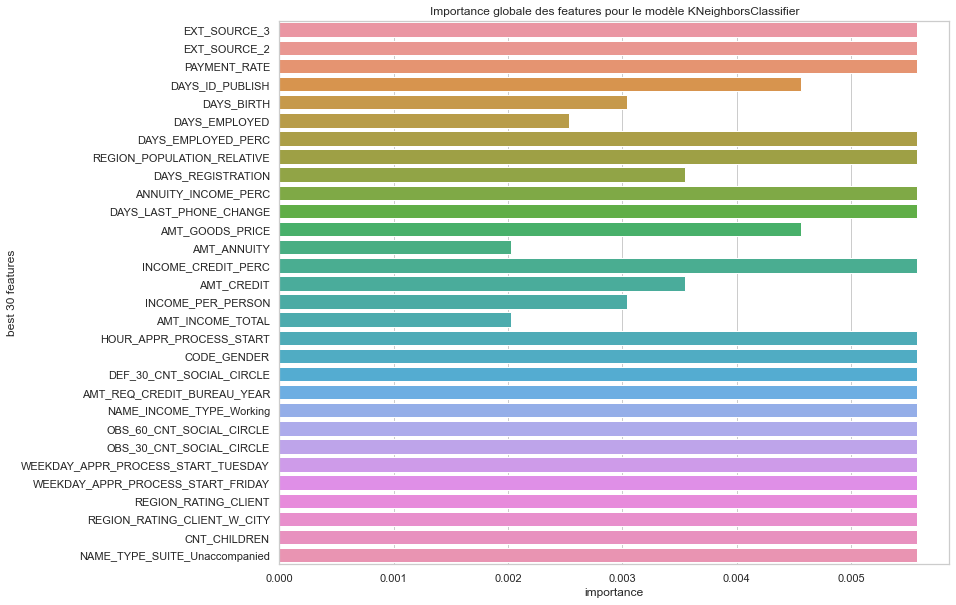

In [239]:
fig, ax = plt.subplots(figsize=(12, 10))
sns.barplot(neigh_importance_df["importance"], best_30_features_df["best 30 features"]).set_title('Importance globale des features pour le modèle KNeighborsClassifier')
plt.show()

In [186]:
print("# USE CASE 1 : Prédiction ")
# USE CASE 1 : Prédiction 

###### Liste des 30 paramètres obligatoires pour prédire l'octroi du prêt ou non à un client via la prédiction du meilleur modèle
EXT_SOURCE_3 = 0
EXT_SOURCE_2 = 0
PAYMENT_RATE = 0
DAYS_ID_PUBLISH = 0
DAYS_BIRTH = 0
DAYS_EMPLOYED = 0
DAYS_EMPLOYED_PERC = 0
REGION_POPULATION_RELATIVE = 0
DAYS_REGISTRATION = 0
ANNUITY_INCOME_PERC = 0
DAYS_LAST_PHONE_CHANGE = 0
AMT_GOODS_PRICE = 0
AMT_ANNUITY = 0
INCOME_CREDIT_PERC = 0
AMT_CREDIT = 0
INCOME_PER_PERSON = 0
AMT_INCOME_TOTAL = 0
HOUR_APPR_PROCESS_START = 0
CODE_GENDER = 0
DEF_30_CNT_SOCIAL_CIRCLE = 0
AMT_REQ_CREDIT_BUREAU_YEAR = 0
NAME_INCOME_TYPE_Working = 0
OBS_60_CNT_SOCIAL_CIRCLE = 0
OBS_30_CNT_SOCIAL_CIRCLE = 0
WEEKDAY_APPR_PROCESS_START_TUESDAY = 0
WEEKDAY_APPR_PROCESS_START_FRIDAY = 0
REGION_RATING_CLIENT = 0
REGION_RATING_CLIENT_W_CITY = 0
CNT_CHILDREN = 0
NAME_TYPE_SUITE_Unaccompanied = 0

data = pd.DataFrame([[EXT_SOURCE_3,
EXT_SOURCE_2,
PAYMENT_RATE,
DAYS_ID_PUBLISH,
DAYS_BIRTH,
DAYS_EMPLOYED,
DAYS_EMPLOYED_PERC,
REGION_POPULATION_RELATIVE,
DAYS_REGISTRATION,
ANNUITY_INCOME_PERC,
DAYS_LAST_PHONE_CHANGE,
AMT_GOODS_PRICE,
AMT_ANNUITY,
INCOME_CREDIT_PERC,
AMT_CREDIT,
INCOME_PER_PERSON,
AMT_INCOME_TOTAL,
HOUR_APPR_PROCESS_START,
CODE_GENDER,
DEF_30_CNT_SOCIAL_CIRCLE,
AMT_REQ_CREDIT_BUREAU_YEAR,
NAME_INCOME_TYPE_Working,
OBS_60_CNT_SOCIAL_CIRCLE,
OBS_30_CNT_SOCIAL_CIRCLE,
WEEKDAY_APPR_PROCESS_START_TUESDAY,
WEEKDAY_APPR_PROCESS_START_FRIDAY,
REGION_RATING_CLIENT,
REGION_RATING_CLIENT_W_CITY,
CNT_CHILDREN,
NAME_TYPE_SUITE_Unaccompanied]], 
columns=['EXT_SOURCE_3',
 'EXT_SOURCE_2',
 'PAYMENT_RATE',
 'DAYS_ID_PUBLISH',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_EMPLOYED_PERC',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'ANNUITY_INCOME_PERC',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_GOODS_PRICE',
 'AMT_ANNUITY',
 'INCOME_CREDIT_PERC',
 'AMT_CREDIT',
 'INCOME_PER_PERSON',
 'AMT_INCOME_TOTAL',
 'HOUR_APPR_PROCESS_START',
 'CODE_GENDER',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_INCOME_TYPE_Working',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
 'WEEKDAY_APPR_PROCESS_START_FRIDAY',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE_Unaccompanied'])

y_pred_1 = neigh.predict(data)

print(f"************** Prédiction du modèle **************")

if y_pred_1[0] == 0:
    print(f"y_pred = {y_pred_1[0]} => Prêt accordé :-)")
else:
    print(f"y_pred = {y_pred_1[0]} => Prêt non accordé :-()")

# USE CASE 1 : Prédiction 
************** Prédiction du modèle **************
y_pred = 0.0 => Prêt accordé :-)


In [187]:
# Récupération de la ligne de data_best_30_features_describe_df où index = 'min' 
min_row = data_best_30_features_describe_df.iloc[7]
print(min_row)

# Création du DataFrame min_df
min_df = pd.DataFrame(min_row)
print(min_df.head())

# Transposition
min_df_transposed = min_df.T
min_df_transposed

EXT_SOURCE_3                          8.854884e-01
EXT_SOURCE_2                          8.549997e-01
PAYMENT_RATE                          1.244286e-01
DAYS_ID_PUBLISH                       0.000000e+00
DAYS_BIRTH                           -7.742000e+03
DAYS_EMPLOYED                        -1.700000e+01
DAYS_EMPLOYED_PERC                    6.957701e-01
REGION_POPULATION_RELATIVE            7.250800e-02
DAYS_REGISTRATION                     0.000000e+00
ANNUITY_INCOME_PERC                   8.184333e-01
DAYS_LAST_PHONE_CHANGE                0.000000e+00
AMT_GOODS_PRICE                       2.925000e+06
AMT_ANNUITY                           1.359360e+05
INCOME_CREDIT_PERC                    6.000000e+00
AMT_CREDIT                            2.925000e+06
INCOME_PER_PERSON                     1.035000e+06
AMT_INCOME_TOTAL                      1.350000e+06
HOUR_APPR_PROCESS_START               2.300000e+01
CODE_GENDER                           1.000000e+00
DEF_30_CNT_SOCIAL_CIRCLE       

,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
max,0.885488,0.855,0.124429,0.0,-7742.0,-17.0,0.69577,0.072508,0.0,0.818433,0.0,2925000.0,135936.0,6.0,2925000.0,1035000.0,1350000.0,23.0,1.0,5.0,11.0,1.0,25.0,25.0,1.0,1.0,3.0,3.0,7.0,1.0


In [188]:
# USE CASE 2 : Prédiction 
y_pred_2 = neigh.predict(min_df_transposed)

print(f"************** Prédiction du modèle **************")

if y_pred_2[0] == 0:
    print(f"y_pred = {y_pred_2[0]} => Prêt accordé :-)")
else:
    print(f"y_pred = {y_pred_2[0]} => Prêt non accordé :-()")

************** Prédiction du modèle **************
y_pred = 0.0 => Prêt accordé :-)


In [189]:
# Récupération de la ligne de data_best_30_features_describe_df où index = 'max' 
max_row = data_best_30_features_describe_df.iloc[7]
print(max_row)

# Création du DataFrame max_df
max_df = pd.DataFrame(max_row)
print(max_df.head())

# Transposition
max_df_transposed = max_df.T
max_df_transposed

# USE CASE 3 : Prédiction 
y_pred_3 = neigh.predict(max_df_transposed)

print(f"************** Prédiction du modèle **************")

if y_pred_3[0] == 0:
    print(f"y_pred = {y_pred_3[0]} => Prêt accordé :-)")
else:
    print(f"y_pred = {y_pred_3[0]} => Prêt non accordé :-()")

EXT_SOURCE_3                          8.854884e-01
EXT_SOURCE_2                          8.549997e-01
PAYMENT_RATE                          1.244286e-01
DAYS_ID_PUBLISH                       0.000000e+00
DAYS_BIRTH                           -7.742000e+03
DAYS_EMPLOYED                        -1.700000e+01
DAYS_EMPLOYED_PERC                    6.957701e-01
REGION_POPULATION_RELATIVE            7.250800e-02
DAYS_REGISTRATION                     0.000000e+00
ANNUITY_INCOME_PERC                   8.184333e-01
DAYS_LAST_PHONE_CHANGE                0.000000e+00
AMT_GOODS_PRICE                       2.925000e+06
AMT_ANNUITY                           1.359360e+05
INCOME_CREDIT_PERC                    6.000000e+00
AMT_CREDIT                            2.925000e+06
INCOME_PER_PERSON                     1.035000e+06
AMT_INCOME_TOTAL                      1.350000e+06
HOUR_APPR_PROCESS_START               2.300000e+01
CODE_GENDER                           1.000000e+00
DEF_30_CNT_SOCIAL_CIRCLE       

In [190]:
# Sauvegarde du modèle
pickle.dump(neigh, open('Model Saved/model.pkl', 'wb'))

In [191]:
# Chargement du modèle
model_loaded = pickle.load(open('Model Saved/model.pkl', 'rb'))

In [192]:
# Utilisation du modèle chargé
y_pred = model_loaded.predict(min_df_transposed)
print(f"label: {y_pred[0]}")

label: 0.0


In [193]:
data_best_30_features_df[data_best_30_features_df.index == 0]

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
0,1.0,0.139376,0.262949,0.060749,-2120,-9461,-637.0,0.067329,0.018801,-3648.0,0.121978,-1134.0,351000.0,24700.5,0.498036,406597.5,202500.0,202500.0,10,0,2.0,1.0,1,2.0,2.0,0,0,2,2,0,1


In [194]:
#
data_id_0 = data_best_30_features_df[data_best_30_features_df.index == 0].drop(columns='TARGET')
data_id_0

,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
0,0.139376,0.262949,0.060749,-2120,-9461,-637.0,0.067329,0.018801,-3648.0,0.121978,-1134.0,351000.0,24700.5,0.498036,406597.5,202500.0,202500.0,10,0,2.0,1.0,1,2.0,2.0,0,0,2,2,0,1


In [195]:
y_pred = model_loaded.predict(data_id_0)
print(f"label: {y_pred[0]}")

label: 1.0


In [196]:
# Implémentation d'une fonction qui prendre les input des utilisateur de l'application
def predict_loan(EXT_SOURCE_3, 
EXT_SOURCE_2, 
PAYMENT_RATE, 
DAYS_ID_PUBLISH, 
DAYS_BIRTH, 
DAYS_EMPLOYED, 
DAYS_EMPLOYED_PERC, 
REGION_POPULATION_RELATIVE, 
DAYS_REGISTRATION, 
ANNUITY_INCOME_PERC, 
DAYS_LAST_PHONE_CHANGE, 
AMT_GOODS_PRICE, 
AMT_ANNUITY, 
INCOME_CREDIT_PERC, 
AMT_CREDIT, 
INCOME_PER_PERSON, 
AMT_INCOME_TOTAL, 
HOUR_APPR_PROCESS_START, 
CODE_GENDER, 
DEF_30_CNT_SOCIAL_CIRCLE, 
AMT_REQ_CREDIT_BUREAU_YEAR, 
NAME_INCOME_TYPE_Working, 
OBS_60_CNT_SOCIAL_CIRCLE, 
OBS_30_CNT_SOCIAL_CIRCLE, 
WEEKDAY_APPR_PROCESS_START_TUESDAY, 
WEEKDAY_APPR_PROCESS_START_FRIDAY, 
REGION_RATING_CLIENT, 
REGION_RATING_CLIENT_W_CITY, 
CNT_CHILDREN, 
NAME_TYPE_SUITE_Unaccompanied):
    
    data = pd.DataFrame([[EXT_SOURCE_3, 
EXT_SOURCE_2, 
PAYMENT_RATE, 
DAYS_ID_PUBLISH, 
DAYS_BIRTH, 
DAYS_EMPLOYED, 
DAYS_EMPLOYED_PERC, 
REGION_POPULATION_RELATIVE, 
DAYS_REGISTRATION, 
ANNUITY_INCOME_PERC, 
DAYS_LAST_PHONE_CHANGE, 
AMT_GOODS_PRICE, 
AMT_ANNUITY, 
INCOME_CREDIT_PERC, 
AMT_CREDIT, 
INCOME_PER_PERSON, 
AMT_INCOME_TOTAL, 
HOUR_APPR_PROCESS_START, 
CODE_GENDER, 
DEF_30_CNT_SOCIAL_CIRCLE, 
AMT_REQ_CREDIT_BUREAU_YEAR, 
NAME_INCOME_TYPE_Working, 
OBS_60_CNT_SOCIAL_CIRCLE, 
OBS_30_CNT_SOCIAL_CIRCLE, 
WEEKDAY_APPR_PROCESS_START_TUESDAY, 
WEEKDAY_APPR_PROCESS_START_FRIDAY, 
REGION_RATING_CLIENT, 
REGION_RATING_CLIENT_W_CITY, 
CNT_CHILDREN, 
NAME_TYPE_SUITE_Unaccompanied]], columns=[EXT_SOURCE_3, 
EXT_SOURCE_2, 
PAYMENT_RATE, 
DAYS_ID_PUBLISH, 
DAYS_BIRTH, 
DAYS_EMPLOYED, 
DAYS_EMPLOYED_PERC, 
REGION_POPULATION_RELATIVE, 
DAYS_REGISTRATION, 
ANNUITY_INCOME_PERC, 
DAYS_LAST_PHONE_CHANGE, 
AMT_GOODS_PRICE, 
AMT_ANNUITY, 
INCOME_CREDIT_PERC, 
AMT_CREDIT, 
INCOME_PER_PERSON, 
AMT_INCOME_TOTAL, 
HOUR_APPR_PROCESS_START, 
CODE_GENDER, 
DEF_30_CNT_SOCIAL_CIRCLE, 
AMT_REQ_CREDIT_BUREAU_YEAR, 
NAME_INCOME_TYPE_Working, 
OBS_60_CNT_SOCIAL_CIRCLE, 
OBS_30_CNT_SOCIAL_CIRCLE, 
WEEKDAY_APPR_PROCESS_START_TUESDAY, 
WEEKDAY_APPR_PROCESS_START_FRIDAY, 
REGION_RATING_CLIENT, 
REGION_RATING_CLIENT_W_CITY, 
CNT_CHILDREN, 
NAME_TYPE_SUITE_Unaccompanied])
    
    prediction = model_loaded.predict(data)
    return prediction[0]

### TEST DE PREDICTION 

In [197]:
# Les dimensions de data_best_30_features_df
data_best_30_features_df.shape

(6571, 31)

In [198]:
# Les 5 premières lignes
data_best_30_features_df.head()

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
0,1.0,0.139376,0.262949,0.060749,-2120,-9461,-637.0,0.067329,0.018801,-3648.0,0.121978,-1134.0,351000.0,24700.5,0.498036,406597.5,202500.0,202500.0,10,0,2.0,1.0,1,2.0,2.0,0,0,2,2,0,1
2,0.0,0.729567,0.555912,0.050000,-2531,-19046,-225.0,0.011814,0.010032,-4260.0,0.100000,-815.0,135000.0,6750.0,0.500000,135000.0,67500.0,67500.0,9,0,0.0,0.0,1,0.0,0.0,0,0,2,2,0,1
5,0.0,0.621226,0.354225,0.056101,-477,-16941,-1588.0,0.093737,0.035792,-4970.0,0.277955,-2536.0,454500.0,27517.5,0.201837,490495.5,49500.0,99000.0,16,0,0.0,1.0,0,0.0,0.0,0,0,2,2,0,0
6,0.0,0.492060,0.724000,0.026463,-619,-13778,-3130.0,0.227174,0.035792,-1213.0,0.241526,-1562.0,1395000.0,41301.0,0.109564,1560726.0,57000.0,171000.0,16,1,0.0,2.0,0,1.0,1.0,0,0,2,2,1,1
7,0.0,0.540654,0.714279,0.027500,-2379,-18850,-449.0,0.023820,0.003122,-4597.0,0.116875,-1070.0,1530000.0,42075.0,0.235294,1530000.0,180000.0,360000.0,16,0,0.0,0.0,0,2.0,2.0,0,0,3,3,0,1


In [199]:
# Les informations générales
data_best_30_features_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6571 entries, 0 to 9999
Data columns (total 31 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   TARGET                              6571 non-null   float64
 1   EXT_SOURCE_3                        6571 non-null   float64
 2   EXT_SOURCE_2                        6571 non-null   float64
 3   PAYMENT_RATE                        6571 non-null   float64
 4   DAYS_ID_PUBLISH                     6571 non-null   int64  
 5   DAYS_BIRTH                          6571 non-null   int64  
 6   DAYS_EMPLOYED                       6571 non-null   float64
 7   DAYS_EMPLOYED_PERC                  6571 non-null   float64
 8   REGION_POPULATION_RELATIVE          6571 non-null   float64
 9   DAYS_REGISTRATION                   6571 non-null   float64
 10  ANNUITY_INCOME_PERC                 6571 non-null   float64
 11  DAYS_LAST_PHONE_CHANGE              6571 no

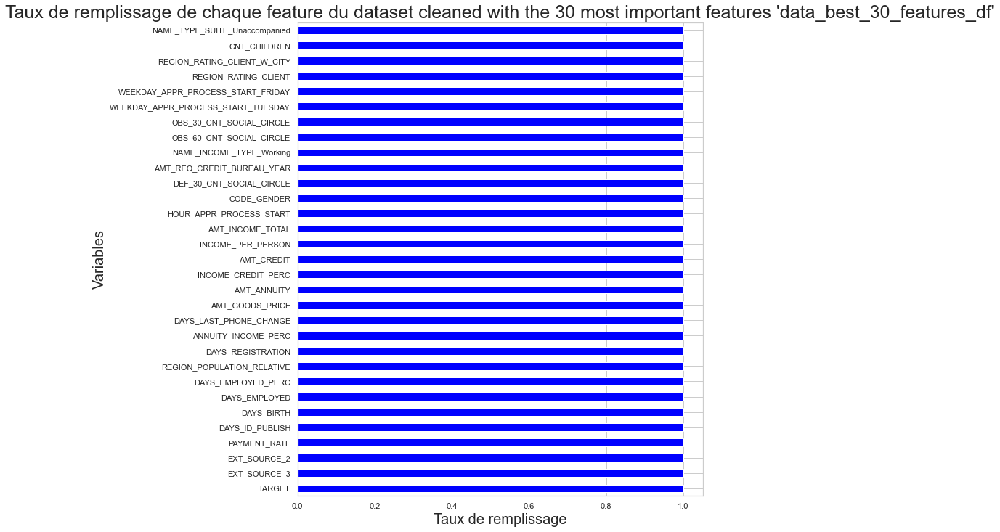

In [200]:
# Affichage du taux de remplissage des features de data_best_30_features_df
data_best_30_features_df.name = "cleaned with the 30 most important features 'data_best_30_features_df'"
afficher_taux_remplissage_variables(data_best_30_features_df, largeur=10, longueur=12, titre="Taux de remplissage de chaque feature")

In [201]:
# Répartition de 'TARGET' pour data_best_30_features_df
data_best_30_features_df.groupby("TARGET")["TARGET"].count()

TARGET
0.0    6046
1.0     525
Name: TARGET, dtype: int64

In [202]:
# Création d'un testing set 'data_prediction_test' avec 1/100 du DataFrame data_best_30_features_df
data_prediction_test = data_best_30_features_df.sample(frac=0.01, replace=False, random_state=1)

In [203]:
# Les dimensions de data_prediction_test
data_prediction_test.shape

(66, 31)

In [204]:
# Répartition de 'TARGET' pour data_prediction_test
data_prediction_test.groupby("TARGET")["TARGET"].count()

TARGET
0.0    59
1.0     7
Name: TARGET, dtype: int64

In [205]:
# Avant suppression 
print(f"Le nombre de features avant suppression est égale à {data_prediction_test.shape[1]}")
data_prediction_test.columns

Le nombre de features avant suppression est égale à 31


Index(['TARGET', 'EXT_SOURCE_3', 'EXT_SOURCE_2', 'PAYMENT_RATE',
       'DAYS_ID_PUBLISH', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_EMPLOYED_PERC',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION',
       'ANNUITY_INCOME_PERC', 'DAYS_LAST_PHONE_CHANGE', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'INCOME_CREDIT_PERC', 'AMT_CREDIT', 'INCOME_PER_PERSON',
       'AMT_INCOME_TOTAL', 'HOUR_APPR_PROCESS_START', 'CODE_GENDER',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'NAME_INCOME_TYPE_Working', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
       'WEEKDAY_APPR_PROCESS_START_FRIDAY', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'CNT_CHILDREN',
       'NAME_TYPE_SUITE_Unaccompanied'],
      dtype='object')

In [206]:
# Création d'un DataFrame sans le feature 'TARGET'
data_prediction_test_OK = data_prediction_test.drop(columns=['TARGET'])

In [207]:
# Après suppression 
print(f"Le nombre de features après suppression est égale à {data_prediction_test_OK.shape[1]}")
data_prediction_test_OK.columns

Le nombre de features après suppression est égale à 30


Index(['EXT_SOURCE_3', 'EXT_SOURCE_2', 'PAYMENT_RATE', 'DAYS_ID_PUBLISH',
       'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_EMPLOYED_PERC',
       'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION',
       'ANNUITY_INCOME_PERC', 'DAYS_LAST_PHONE_CHANGE', 'AMT_GOODS_PRICE',
       'AMT_ANNUITY', 'INCOME_CREDIT_PERC', 'AMT_CREDIT', 'INCOME_PER_PERSON',
       'AMT_INCOME_TOTAL', 'HOUR_APPR_PROCESS_START', 'CODE_GENDER',
       'DEF_30_CNT_SOCIAL_CIRCLE', 'AMT_REQ_CREDIT_BUREAU_YEAR',
       'NAME_INCOME_TYPE_Working', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'WEEKDAY_APPR_PROCESS_START_TUESDAY',
       'WEEKDAY_APPR_PROCESS_START_FRIDAY', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'CNT_CHILDREN',
       'NAME_TYPE_SUITE_Unaccompanied'],
      dtype='object')

In [208]:
# La liste des index de data_prediction_test_OK
indexes_data_prediction_test_OK_list = list(data_prediction_test_OK.index)
indexes_data_prediction_test_OK_list

[9106,
 6585,
 6320,
 8158,
 5593,
 1851,
 3116,
 4798,
 2812,
 7102,
 8921,
 5822,
 578,
 1904,
 8038,
 2813,
 4207,
 1661,
 7913,
 4135,
 8908,
 4635,
 2799,
 9537,
 5882,
 170,
 7882,
 381,
 8349,
 3248,
 3721,
 6614,
 6205,
 4478,
 5621,
 7152,
 1899,
 9458,
 7420,
 7112,
 9685,
 9300,
 6874,
 7650,
 4846,
 846,
 6207,
 9815,
 8162,
 8021,
 4448,
 2240,
 4136,
 4459,
 3130,
 3323,
 1994,
 4030,
 8892,
 5741,
 3110,
 6476,
 7533,
 211,
 2306,
 2758]

In [209]:
data_prediction_test_OK.head(10)

,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
9106,0.565608,0.048793,0.036210,-4697,-22846,-610.0,0.026701,0.025164,-3843.0,0.213000,-1856.0,450000.0,16294.5,0.170000,450000.0,38250.0,76500.0,15,1,2.0,1.0,1,2.0,2.0,0,0,2,2,0,1
6585,0.349055,0.197837,0.119302,-3453,-11283,-620.0,0.054950,0.022625,-9994.0,0.368533,-180.0,180000.0,24876.0,0.323722,208512.0,22500.0,67500.0,11,1,0.0,2.0,0,0.0,0.0,0,0,2,2,1,0
6320,0.232725,0.667152,0.077386,-3213,-10596,-1485.0,0.140147,0.007330,-2818.0,0.139571,-1551.0,454500.0,35172.0,0.554455,454500.0,126000.0,252000.0,13,0,0.0,6.0,1,0.0,0.0,0,0,2,2,0,1
8158,0.576209,0.126995,0.048366,-5305,-13012,-1028.0,0.079004,0.009549,-5379.0,0.096732,-2241.0,504000.0,24376.5,0.500000,504000.0,84000.0,252000.0,14,0,0.0,2.0,1,3.0,3.0,1,0,2,2,1,1
5593,0.205598,0.585089,0.037060,-4046,-11393,-1687.0,0.148073,0.030755,-2008.0,0.111543,-320.0,360000.0,17568.0,0.332245,474048.0,39375.0,157500.0,12,1,0.0,0.0,1,0.0,0.0,1,0,2,2,2,1
1851,0.337673,0.689514,0.060679,-2894,-13429,-90.0,0.006702,0.030755,-886.0,0.251036,0.0,450000.0,31630.5,0.241713,521280.0,42000.0,126000.0,17,1,0.0,1.0,0,0.0,0.0,0,1,2,2,1,1
3116,0.150085,0.503894,0.051300,-2452,-18937,-1669.0,0.088134,0.014520,-6907.0,0.307800,-511.0,540000.0,27702.0,0.166667,540000.0,45000.0,90000.0,7,1,1.0,1.0,1,1.0,1.0,0,0,2,2,0,1
4798,0.486653,0.306176,0.080146,-5366,-15201,-940.0,0.061838,0.010500,-5971.0,0.073400,-1565.0,112500.0,9909.0,1.091902,123637.5,67500.0,135000.0,15,0,0.0,1.0,1,4.0,4.0,1,0,3,3,0,1
2812,0.508287,0.661500,0.039864,-4296,-16274,-1204.0,0.073983,0.026392,-7314.0,0.082074,-1522.0,630000.0,25114.5,0.485714,630000.0,306000.0,306000.0,13,1,0.0,2.0,1,0.0,0.0,0,0,2,2,0,0
7102,0.344155,0.709147,0.106098,-3337,-11121,-3298.0,0.296556,0.032561,-5228.0,0.125667,-2232.0,225000.0,25447.5,0.844278,239850.0,101250.0,202500.0,12,1,0.0,0.0,1,0.0,0.0,0,0,1,1,0,1


In [210]:
# Sélection d'une ligne à partir de son index
data_prediction_test_OK[data_prediction_test_OK.index == 9106]

,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
9106,0.565608,0.048793,0.03621,-4697,-22846,-610.0,0.026701,0.025164,-3843.0,0.213,-1856.0,450000.0,16294.5,0.17,450000.0,38250.0,76500.0,15,1,2.0,1.0,1,2.0,2.0,0,0,2,2,0,1


In [211]:
data['EXT_SOURCE_3'].values[0]

0

In [212]:
data_prediction_test_OK[data_prediction_test_OK.index == 9106].values

array([[ 5.65607981e-01,  4.87934581e-02,  3.62100000e-02,
        -4.69700000e+03, -2.28460000e+04, -6.10000000e+02,
         2.67005165e-02,  2.51640000e-02, -3.84300000e+03,
         2.13000000e-01, -1.85600000e+03,  4.50000000e+05,
         1.62945000e+04,  1.70000000e-01,  4.50000000e+05,
         3.82500000e+04,  7.65000000e+04,  1.50000000e+01,
         1.00000000e+00,  2.00000000e+00,  1.00000000e+00,
         1.00000000e+00,  2.00000000e+00,  2.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  2.00000000e+00,
         2.00000000e+00,  0.00000000e+00,  1.00000000e+00]])

In [213]:
# Test de la fonction de prédiction sur le testing set préparé : 'data_prediction_test_OK'
data_prediction_test_OK_NUMROWS = data_prediction_test_OK.shape[0]
indexes_data_prediction_test_OK_list_LENGTH = len(indexes_data_prediction_test_OK_list)
loans_not_granted_list = list()

print(f"data_prediction_test_OK_NUMROWS = {data_prediction_test_OK_NUMROWS}")
print(f"indexes_data_prediction_test_OK_list_LENGTH = {indexes_data_prediction_test_OK_list_LENGTH}")

print()

print(f"############### PREDICTION PAR INDEX DES {indexes_data_prediction_test_OK_list_LENGTH} CLIENTS du testing set : 'data_prediction_test_OK' ###############")

print()

for i in indexes_data_prediction_test_OK_list:
    data = data_prediction_test_OK[data_prediction_test_OK.index == i]

    EXT_SOURCE_3 = data['EXT_SOURCE_3'].values[0]
    EXT_SOURCE_2 = data['EXT_SOURCE_2'].values[0]
    PAYMENT_RATE= data['PAYMENT_RATE'].values[0]
    DAYS_ID_PUBLISH = data['DAYS_ID_PUBLISH'].values[0]
    DAYS_BIRTH = data['DAYS_BIRTH'].values[0]
    DAYS_EMPLOYED = data['DAYS_EMPLOYED'].values[0]
    DAYS_EMPLOYED_PERC = data['DAYS_EMPLOYED_PERC'].values[0]
    REGION_POPULATION_RELATIVE = data['REGION_POPULATION_RELATIVE'].values[0]
    DAYS_REGISTRATION = data['DAYS_REGISTRATION'].values[0]
    ANNUITY_INCOME_PERC = data['ANNUITY_INCOME_PERC'].values[0]
    DAYS_LAST_PHONE_CHANGE = data['DAYS_LAST_PHONE_CHANGE'].values[0]
    AMT_GOODS_PRICE = data['AMT_GOODS_PRICE'].values[0]
    AMT_ANNUITY = data['AMT_ANNUITY'].values[0]
    INCOME_CREDIT_PERC = data['INCOME_CREDIT_PERC'].values[0]
    AMT_CREDIT = data['AMT_CREDIT'].values[0]
    INCOME_PER_PERSON = data['INCOME_PER_PERSON'].values[0]
    AMT_INCOME_TOTAL = data['AMT_INCOME_TOTAL'].values[0]
    HOUR_APPR_PROCESS_START = data['HOUR_APPR_PROCESS_START'].values[0]
    CODE_GENDER = data['CODE_GENDER'].values[0]
    DEF_30_CNT_SOCIAL_CIRCLE = data['DEF_30_CNT_SOCIAL_CIRCLE'].values[0]
    AMT_REQ_CREDIT_BUREAU_YEAR = data['AMT_REQ_CREDIT_BUREAU_YEAR'].values[0]
    NAME_INCOME_TYPE_Working = data['NAME_INCOME_TYPE_Working'].values[0]
    OBS_60_CNT_SOCIAL_CIRCLE = data['OBS_60_CNT_SOCIAL_CIRCLE'].values[0]
    OBS_30_CNT_SOCIAL_CIRCLE = data['OBS_30_CNT_SOCIAL_CIRCLE'].values[0]
    WEEKDAY_APPR_PROCESS_START_TUESDAY = data['WEEKDAY_APPR_PROCESS_START_TUESDAY'].values[0]
    WEEKDAY_APPR_PROCESS_START_FRIDAY = data['WEEKDAY_APPR_PROCESS_START_FRIDAY'].values[0]
    REGION_RATING_CLIENT = data['REGION_RATING_CLIENT'].values[0]
    REGION_RATING_CLIENT_W_CITY = data['REGION_RATING_CLIENT_W_CITY'].values[0]
    CNT_CHILDREN = data['CNT_CHILDREN'].values[0]
    NAME_TYPE_SUITE_Unaccompanied = data['NAME_TYPE_SUITE_Unaccompanied'].values[0]
    
    loan_prediction = predict_loan(EXT_SOURCE_3, EXT_SOURCE_2, PAYMENT_RATE, DAYS_ID_PUBLISH, DAYS_BIRTH, 
                                   DAYS_EMPLOYED, DAYS_EMPLOYED_PERC, REGION_POPULATION_RELATIVE, DAYS_REGISTRATION, 
                                   ANNUITY_INCOME_PERC, DAYS_LAST_PHONE_CHANGE, AMT_GOODS_PRICE, AMT_ANNUITY, 
                                   INCOME_CREDIT_PERC, AMT_CREDIT, INCOME_PER_PERSON, AMT_INCOME_TOTAL, HOUR_APPR_PROCESS_START, 
                                   CODE_GENDER, DEF_30_CNT_SOCIAL_CIRCLE, AMT_REQ_CREDIT_BUREAU_YEAR, NAME_INCOME_TYPE_Working, 
                                   OBS_60_CNT_SOCIAL_CIRCLE, OBS_30_CNT_SOCIAL_CIRCLE, WEEKDAY_APPR_PROCESS_START_TUESDAY, 
                                   WEEKDAY_APPR_PROCESS_START_FRIDAY, REGION_RATING_CLIENT, REGION_RATING_CLIENT_W_CITY, 
                                   CNT_CHILDREN, NAME_TYPE_SUITE_Unaccompanied)
    
    print(f"ROW INDEX = {i}, Prédiction : {'Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)' if loan_prediction == 0 else 'Prêt non accordé ! :-|'}")
    
    if loan_prediction == 1 :
        loans_not_granted_list.append(data)
    
print()

print("############################# ***** FIN ***** #############################")

data_prediction_test_OK_NUMROWS = 66
indexes_data_prediction_test_OK_list_LENGTH = 66

############### PREDICTION PAR INDEX DES 66 CLIENTS du testing set : 'data_prediction_test_OK' ###############

ROW INDEX = 9106, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 6585, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 6320, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 8158, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 5593, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 1851, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 3116, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 4798, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 2812, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX = 7102, Prédiction : Prêt accordé ! Youuuuuuuuupppppppppiiiiiiii :-)
ROW INDEX =

In [214]:
print(f"{len(loans_not_granted_list)}/{indexes_data_prediction_test_OK_list_LENGTH} prêts n'ont pas été accordés :-!")
loans_not_granted_list

4/66 prêts n'ont pas été accordés :-!


[      EXT_SOURCE_3  EXT_SOURCE_2  PAYMENT_RATE  DAYS_ID_PUBLISH  DAYS_BIRTH  \
 8038      0.694093      0.544098      0.048109            -4276      -13529   
 
       DAYS_EMPLOYED  DAYS_EMPLOYED_PERC  REGION_POPULATION_RELATIVE  \
 8038        -2007.0            0.148348                    0.028663   
 
       DAYS_REGISTRATION  ANNUITY_INCOME_PERC  DAYS_LAST_PHONE_CHANGE  \
 8038            -7511.0             0.161967                     0.0   
 
       AMT_GOODS_PRICE  AMT_ANNUITY  INCOME_CREDIT_PERC  AMT_CREDIT  \
 8038         454500.0      21865.5             0.29703    454500.0   
 
       INCOME_PER_PERSON  AMT_INCOME_TOTAL  HOUR_APPR_PROCESS_START  \
 8038            67500.0          135000.0                       13   
 
       CODE_GENDER  DEF_30_CNT_SOCIAL_CIRCLE  AMT_REQ_CREDIT_BUREAU_YEAR  \
 8038            1                       0.0                         0.0   
 
       NAME_INCOME_TYPE_Working  OBS_60_CNT_SOCIAL_CIRCLE  \
 8038                         1          

In [240]:
# Index des clients pour lequels le prêt est non accordé !
# 8038, 381, 3110, 2758
data_prediction_test[data_prediction_test.index == 8038]

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
8038,1.0,0.694093,0.544098,0.048109,-4276,-13529,-2007.0,0.148348,0.028663,-7511.0,0.161967,0.0,454500.0,21865.5,0.29703,454500.0,67500.0,135000.0,13,1,0.0,0.0,1,17.0,17.0,0,0,2,2,1,1


In [241]:
data_prediction_test[data_prediction_test.index == 381]

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
381,1.0,0.06511,0.482209,0.073173,-727,-8038,-609.0,0.075765,0.01885,-8038.0,0.282611,-510.0,247500.0,22891.5,0.258918,312840.0,40500.0,81000.0,17,0,0.0,1.0,1,6.0,6.0,0,0,2,2,0,1


In [242]:
data_prediction_test[data_prediction_test.index == 3110]

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
3110,1.0,0.360613,0.165995,0.027492,-1052,-8387,-344.0,0.041016,0.025164,-8340.0,0.11263,0.0,270000.0,9382.5,0.244093,341280.0,41652.0,83304.0,14,1,0.0,0.0,0,3.0,3.0,0,0,2,2,0,1


In [243]:
data_prediction_test[data_prediction_test.index == 2758]

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,PAYMENT_RATE,DAYS_ID_PUBLISH,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_EMPLOYED_PERC,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,ANNUITY_INCOME_PERC,DAYS_LAST_PHONE_CHANGE,AMT_GOODS_PRICE,AMT_ANNUITY,INCOME_CREDIT_PERC,AMT_CREDIT,INCOME_PER_PERSON,AMT_INCOME_TOTAL,HOUR_APPR_PROCESS_START,CODE_GENDER,DEF_30_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_INCOME_TYPE_Working,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,WEEKDAY_APPR_PROCESS_START_TUESDAY,WEEKDAY_APPR_PROCESS_START_FRIDAY,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,CNT_CHILDREN,NAME_TYPE_SUITE_Unaccompanied
2758,1.0,0.633032,0.421448,0.038011,-2055,-11075,-1767.0,0.159549,0.035792,-4121.0,0.17295,-205.0,409500.0,15565.5,0.21978,409500.0,90000.0,90000.0,10,1,0.0,1.0,1,1.0,1.0,0,0,2,2,0,1


In [244]:
# Suvegarde du jeu de données pour tester le modèle 
data_prediction_test.to_csv("C:\\Users\\patri\\OneDrive\Documents\\OpenClassroom\Projets\\Projet #7\\Home_Credit_Default_Risk\\testing_model_set.csv")